In [1]:
#Initiating functions and importing Libraries-

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import pandas as pd
from PIL import Image
import fnmatch
import cv2
import glob
import time
import scipy.ndimage as ndimage
from tkinter import *
from PIL import ImageTk, Image, ImageDraw, ImageEnhance
from datetime import datetime
import statistics
from scipy import optimize
from skimage.draw import disk
from sklearn.metrics import mean_squared_error
from skimage import io
import math
import matplotlib.patches as patches
from scipy.ndimage import gaussian_filter
import matplotlib.colors as mcolors

def get_timestamp():
    date_time = datetime.now()
    # convert timestamp to string in dd-mm-yyyy HH:MM:SS
    str_date_time = date_time.strftime("%Y_%m_%d-%H_%M_%S")
    return(str_date_time)

def get_x_and_y(event):
    global lasx, lasy
    lasx, lasy = event.x, event.y

def paint(event):
    x1, y1 = (event.x - 10), (event.y - 10)
    x2, y2 = (event.x + 10), (event.y + 10)
    canvas.create_oval(x1, y1, x2, y2, fill="white",width=8)
    draw.ellipse([x1, y1, x2, y2],fill="white",width=15)


#This function checks the folder different wavelength data and returns a list of what is present- 
def getwavelist(folderpath):
    wavelist=[]
    waveopts=[405, 442, 473, 543, 632]
    for wv in waveopts:
        wavelengthforpath="analyzed_"+str(wv)+"_MES"
        ims = glob.glob(os.path.join(folderpath, wavelengthforpath, "*.txt"))
        if len(ims):
            wavelist.append(wv)
    print(wavelist)        
    return(wavelist)

#This function loads data from compressed files and organizes it all into a list of lists-
def listparams(folderpath):
    waveopts=[405, 442, 473, 543, 632]
 
    filler= np.array([0, 0, 0, 0])
    depolarization=[]
    ret_angle=[]
    retardance=[]
    
    for i in range(len(waveopts)):
        wave=waveopts[i]
        wavepath=os.path.join(folderpath, str(wave)+".npz")
        print(wavepath)
        no_data=True
        if os.path.isfile(wavepath):
            wavefile=np.load(wavepath)
            if wavefile['retang'].shape==(1024,1024):
                no_data=False
                ret_angle.append(wavefile['retang'])
                depolarization.append(wavefile['depol'])
                retardance.append(wavefile['ret']) 
            
                #Plots
                p3=plt.imshow(retardance[i], cmap='hsv')
                plt.colorbar(p3)
                plt.title("Retardance "+str(wave),font="Times New Roman",fontsize='15')
                plt.show()
            
        if no_data:
            print("No Data ", wave)
            depolarization.append(filler)
            ret_angle.append(filler) 
            retardance.append(filler) 

    listlist=[depolarization, ret_angle, retardance]
    
    return(listlist)

#Registration Functions
def twodshift(im,shiftx,shifty):
    newimage=np.zeros(im.shape)
    if shiftx>0 and shifty>0:
        newimage[shifty:,shiftx:]=im[:-shifty,:-shiftx]
    elif shiftx<0 and shifty>0:
        newimage[shifty:,:shiftx]=im[:-shifty,-shiftx:]
    elif shiftx>0 and shifty<0:
        newimage[:shifty:,shiftx:]=im[-shifty:,:-shiftx]
    elif shiftx<0 and shifty<0:
        newimage[:shifty,:shiftx]=im[-shifty:,-shiftx:]
    elif shiftx==0 and shifty<0:
        newimage[:shifty,:]=im[-shifty:,:]
    elif shiftx==0 and shifty>0:
        newimage[shifty:,:]=im[:-shifty,:]
    elif shiftx<0 and shifty==0:
        newimage[:,:shiftx]=im[:,-shiftx:]
    elif shiftx>0 and shifty==0:
        newimage[:,shiftx:]=im[:,:-shiftx]
    else:
        newimage=im
    return(newimage)


def Eyeballrot(Reg_im, lineup_im, angle, shiftx, shifty, show='y'):

    Baseline=lineup_im/np.max(lineup_im)
    
    Reg_im_plane=ndimage.rotate(Reg_im, angle, reshape=False)
    Reg_im_plane=twodshift(Reg_im_plane,shiftx,shifty)

    Reg_im=Reg_im/np.max(Reg_im)
    Reg_im_rot=ndimage.rotate(Reg_im, angle, reshape=False)
    Reg_im_shift=twodshift(Reg_im_rot,shiftx,shifty)
    
    if show=='y':
        plt.imshow(cv2.convertScaleAbs(Reg_im_shift, alpha=7, beta=10))
        plt.imshow(cv2.convertScaleAbs(Baseline, alpha=2, beta=1), alpha=.25)
        plt.show()
    
    return(Reg_im_plane)

import PIL

#This function gives a timestamp down to the minute-
def timestamp():
    named_tuple = time.localtime() # get struct_time
    time_string = time.strftime("%Y%m%d_%H%M", named_tuple)
    return(time_string)
    
def show_change():
    global w1val, w2val, w3val
    w1val=w1.get()
    w2val=w2.get()
    w3val=w3.get()
    w4val=w4.get()
    w5val=w5.get()
    #need to rotate here-

    updatedarray=ndimage.rotate(testarray, w3val, reshape=False)
    
    #putting array back into the proper format-
    image2=Image.fromarray(updatedarray.astype(np.uint8))
    image2.putalpha(w4val)
    enhancer=ImageEnhance.Contrast(image2)
    image2=enhancer.enhance(w5val/5)
    
    global test_image
    test_image=ImageTk.PhotoImage(image2)
    
    canvas.delete('all')
    canvas.create_image(256,256, image = mask_ref_image)
    canvas.create_image(256+w1val,256+w2val, image = test_image)


def line_up_gui(referenceimage, dataimage):
    #Put reference image in the correct format so it can be used in gui-
    referenceimage=cv2.resize(referenceimage,(512,512))
    referenceimage = (referenceimage * 500).astype(np.uint8)
    np.where(referenceimage>255,255,referenceimage)
    rgb_ref=np.zeros((referenceimage.shape[0],referenceimage.shape[1],3))
    for i in range(3):
        rgb_ref[:,:,i]=referenceimage
    
    #Put data image in the correct format so it can be used in gui-  
    dataimage=cv2.resize(dataimage,(512,512))
    dataimage = (dataimage * 500).astype(np.uint8)
    np.where(dataimage>255,255,dataimage)
    rgb_data=np.zeros((dataimage.shape[0],dataimage.shape[1],3))
    rgb_data[:,:,2]=dataimage
    rgb_data[:,:,1]=0.5*dataimage
    
    global testarray
    testarray=rgb_data

    image1=Image.fromarray(rgb_ref.astype(np.uint8))
    
    image2=Image.fromarray(testarray.astype(np.uint8))
    image2.putalpha(128)
    
    width = referenceimage.shape[1] # canvas width
    height = referenceimage.shape[0] # canvas height
    center=(int(height/2),int(width/2))

    master = Tk()
    global mask_ref_image
    mask_ref_image =  ImageTk.PhotoImage(image1)
    global test_image
    test_image=ImageTk.PhotoImage(image2)
    # create a tkinter canvas to draw on
    global canvas
    canvas = Canvas(width=width, height=height, bg='black')
    canvas.create_image(center[1],center[0], image = mask_ref_image)
    canvas.create_image(center[1],center[0], image = test_image)
    canvas.pack()
    
    global w1, w2, w3, w4, w5
    w1 = Scale(master, from_=-150, to=150,length=300, orient=HORIZONTAL, label='horizontal shift')
    w1.pack()
    w2 = Scale(master, from_=-150, to=150,length=300, orient=HORIZONTAL,label='vertical shift')
    w2.pack()
    w3 = Scale(master, from_=-180, to=180,length=300, orient=HORIZONTAL,label='angle of rotation')
    w3.pack()
    w4 = Scale(master, from_=0, to=255,length=300, orient=HORIZONTAL, label='transparency')
    w4.set(128)
    w4.pack()
    w5 = Scale(master, from_=0, to=15,length=300, orient=HORIZONTAL, label='contrast')
    w5.set(5)
    w5.pack()
    Button(master, text='Show', command=show_change).pack()
    
    master.mainloop()
    
    return(w1val, w2val, w3val)

20221007_1624_05xM_BRAINSTEM_6-0
Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1624_05xM_BRAINSTEM_6-0\polardecomp\405.npz


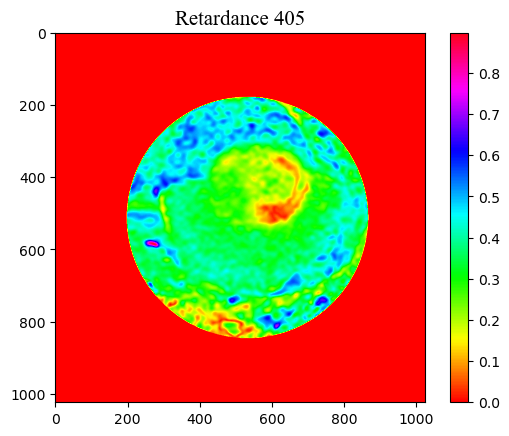

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1624_05xM_BRAINSTEM_6-0\polardecomp\442.npz


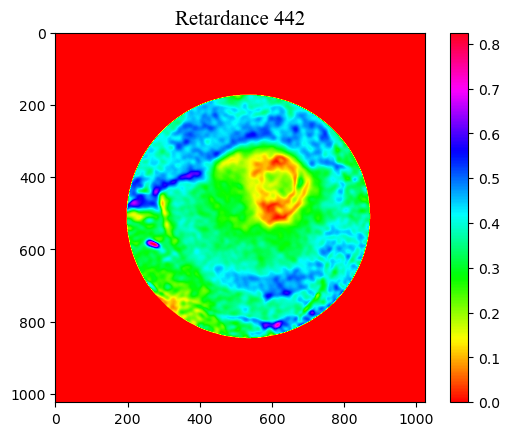

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1624_05xM_BRAINSTEM_6-0\polardecomp\473.npz


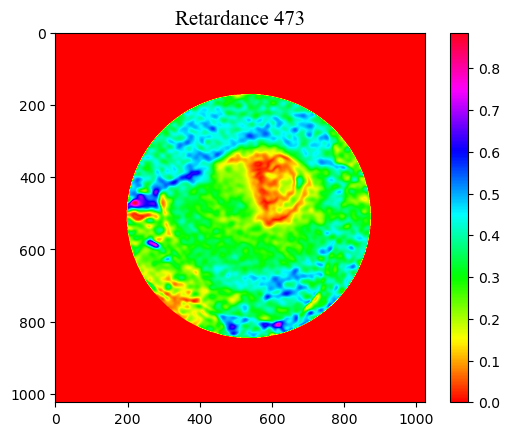

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1624_05xM_BRAINSTEM_6-0\polardecomp\543.npz


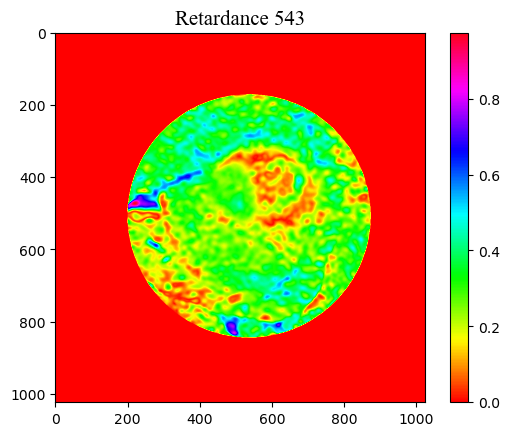

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1624_05xM_BRAINSTEM_6-0\polardecomp\632.npz


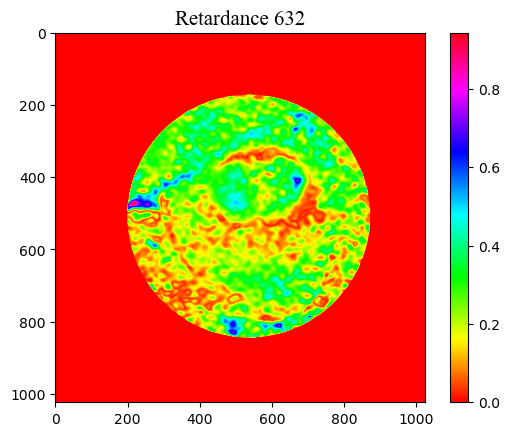

20221007_1646_05xM_BRAINSTEM_6-45
Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1646_05xM_BRAINSTEM_6-45\polardecomp\405.npz


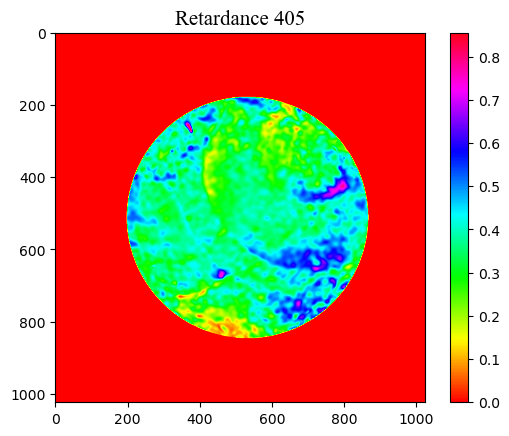

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1646_05xM_BRAINSTEM_6-45\polardecomp\442.npz


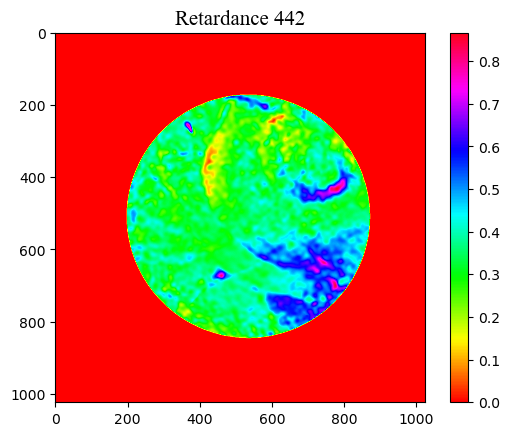

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1646_05xM_BRAINSTEM_6-45\polardecomp\473.npz


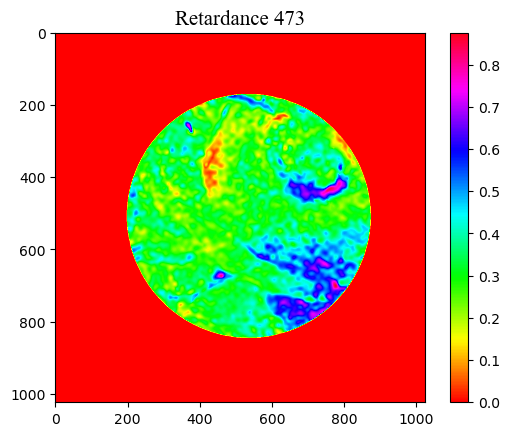

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1646_05xM_BRAINSTEM_6-45\polardecomp\543.npz


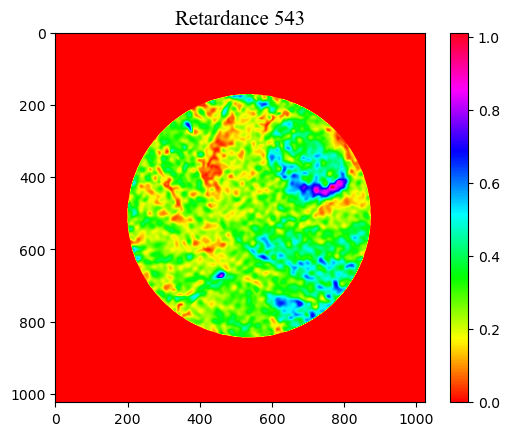

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1646_05xM_BRAINSTEM_6-45\polardecomp\632.npz


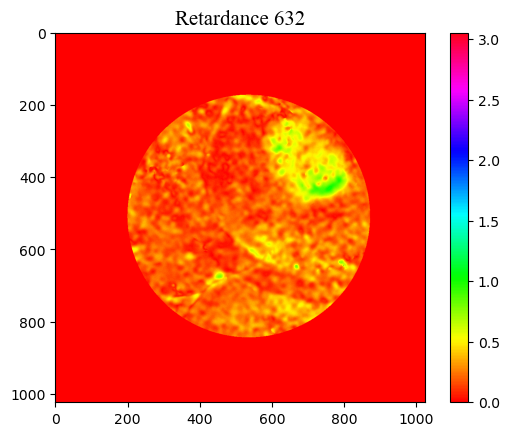

20221007_1659_05xM_BRAINSTEM_6-90
Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1659_05xM_BRAINSTEM_6-90\polardecomp\405.npz


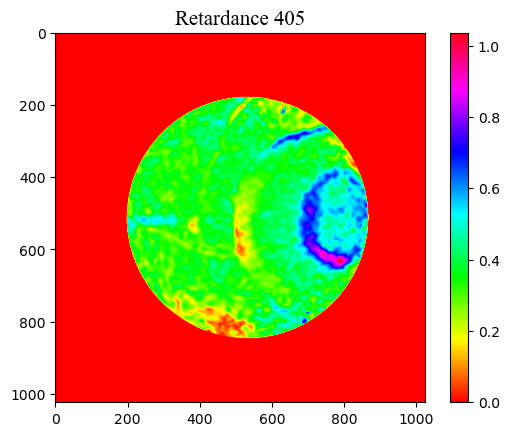

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1659_05xM_BRAINSTEM_6-90\polardecomp\442.npz


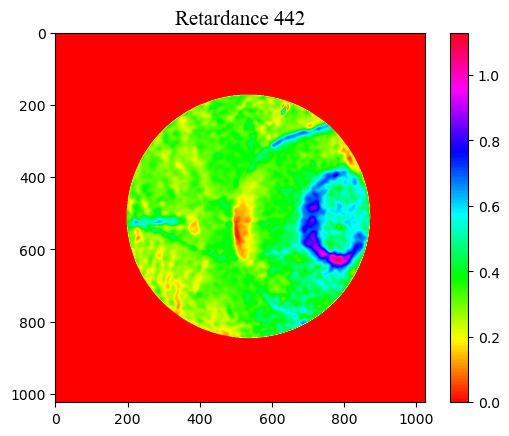

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1659_05xM_BRAINSTEM_6-90\polardecomp\473.npz


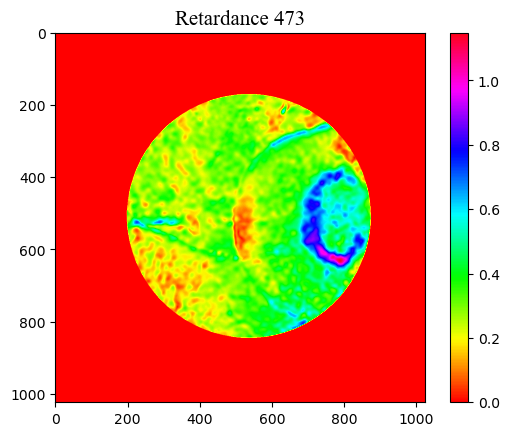

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1659_05xM_BRAINSTEM_6-90\polardecomp\543.npz


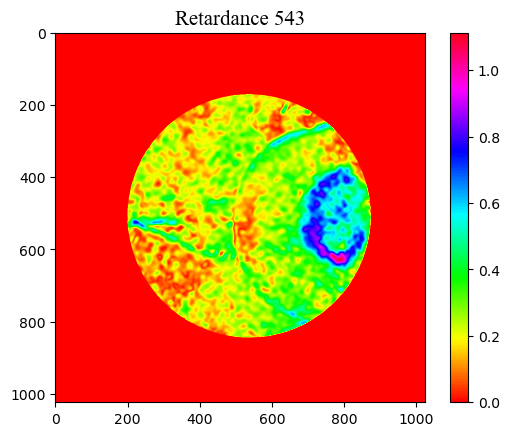

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1659_05xM_BRAINSTEM_6-90\polardecomp\632.npz


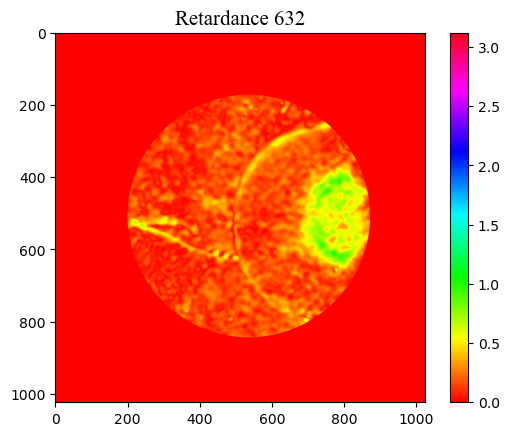

20221007_1710_05xM_BRAINSTEM_6-135
Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1710_05xM_BRAINSTEM_6-135\polardecomp\405.npz


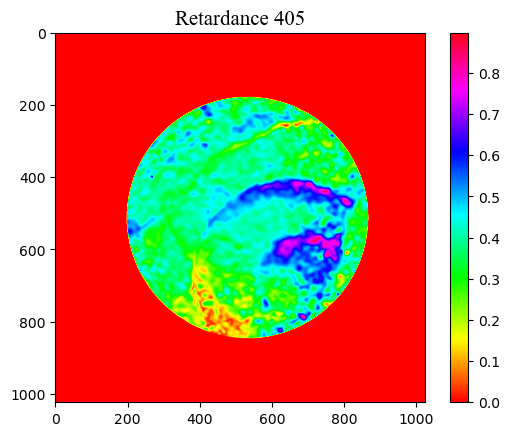

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1710_05xM_BRAINSTEM_6-135\polardecomp\442.npz


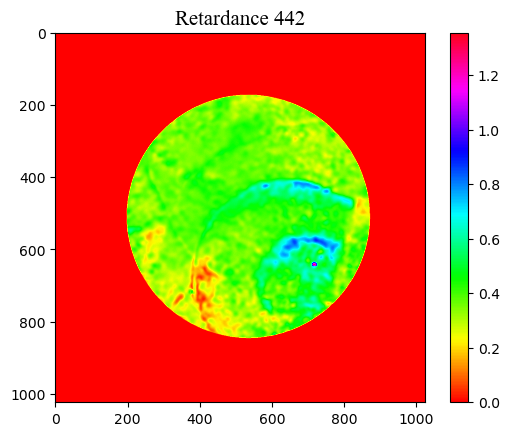

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1710_05xM_BRAINSTEM_6-135\polardecomp\473.npz


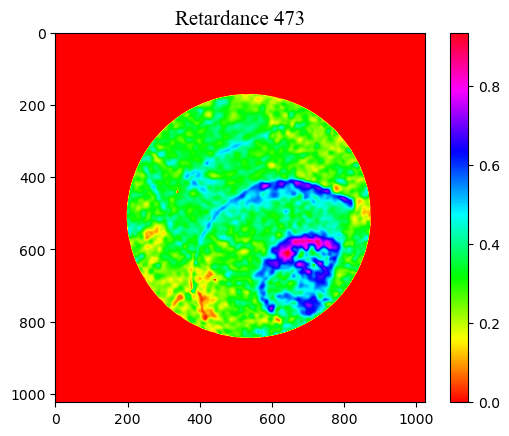

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1710_05xM_BRAINSTEM_6-135\polardecomp\543.npz


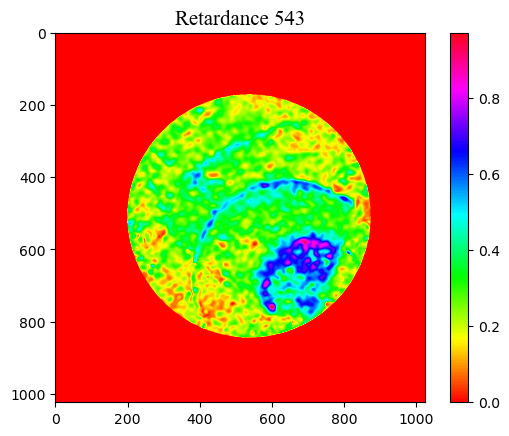

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1710_05xM_BRAINSTEM_6-135\polardecomp\632.npz


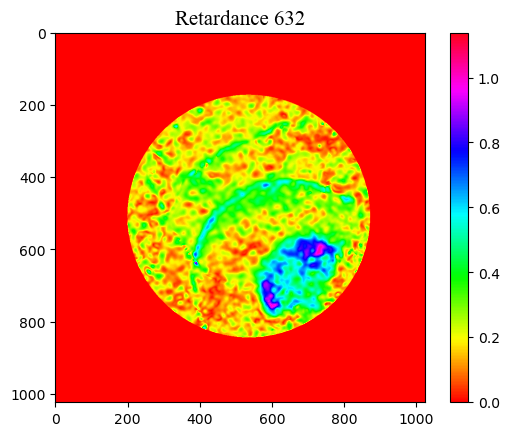

20221007_1719_05xM_BRAINSTEM_6-180
Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1719_05xM_BRAINSTEM_6-180\polardecomp\405.npz


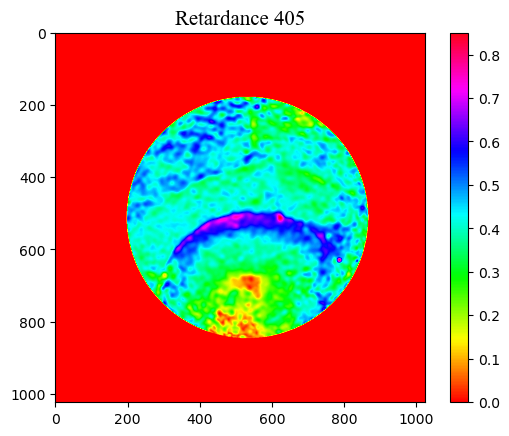

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1719_05xM_BRAINSTEM_6-180\polardecomp\442.npz


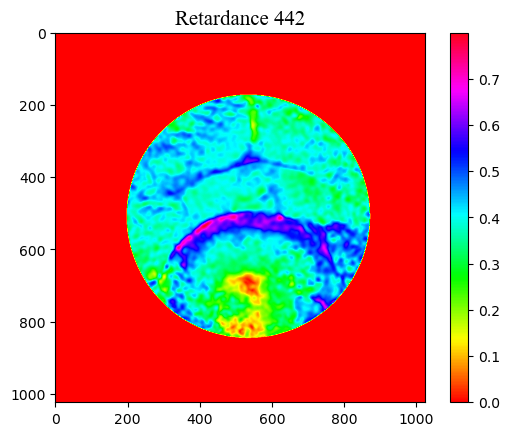

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1719_05xM_BRAINSTEM_6-180\polardecomp\473.npz


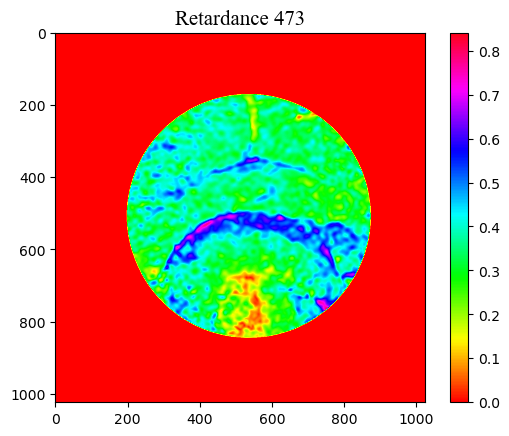

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1719_05xM_BRAINSTEM_6-180\polardecomp\543.npz


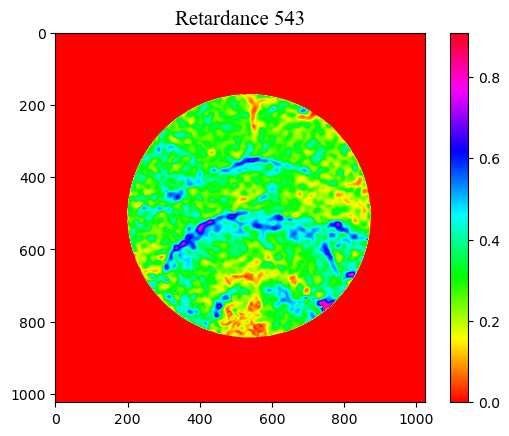

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\20221007_1719_05xM_BRAINSTEM_6-180\polardecomp\632.npz


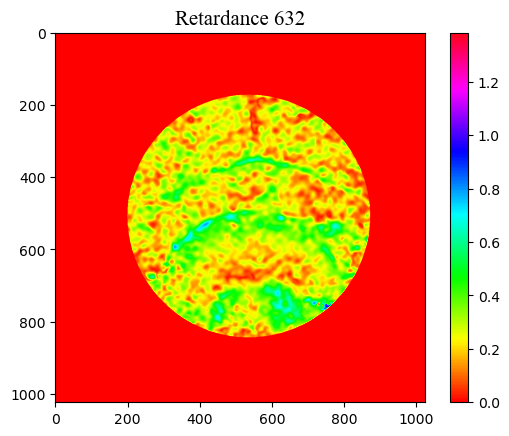

Rotation_guide_data.xlsx
masks
resulting plots
resulting plots (1)


In [28]:
#Loads all data from a folder imports it into a list- 
MainFolder=r"Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM"
Megalist=[]
Subfolderlist=[]

for i in range(int(len(os.listdir(MainFolder)))):
    subfolder=sorted(os.listdir(MainFolder))[i]
    print(subfolder)
    decomp_data_path=os.path.join(MainFolder,subfolder, "polardecomp")
    if os.path.isdir(decomp_data_path):
        datalist=listparams(decomp_data_path)
        Megalist.append(datalist)
        Subfolderlist.append(subfolder)

In [4]:
#Run through allignment function for each data set in the folder. Manually allign the images in the pop up window and the values will be saved to a list.

valuelist=[(Subfolderlist[0],0,0,0)]

for i in range(len(Megalist)-1):
    testfile=Megalist[i+1][0][0]
    #wavelengthindex set from wavelength list- set to 405 to start and automatically changes if there's no 405 data. 
    #other wavelengths can be selected to use which are easier to see, can be set accordingly-
    #Wavelength indexes- 0- 405, 1-442, 2- 473, 3-543, 4-632
    wavelengthindex=3
    while testfile.shape!=(1024,1024) and wavelengthindex<4:
        testfile=Megalist[i+1][0][wavelengthindex]
        j=j+1
    hshift, vshift, angle=line_up_gui(Megalist[0][0][wavelengthindex],testfile)
    rotdata=Eyeballrot(testfile,Megalist[0][0][wavelengthindex], angle, 2*hshift, 2*vshift)
    
    valuelist.append((Subfolderlist[i+1],angle, 2*hshift,2*vshift))


IndexError: list index out of range

In [10]:
#Save Transformation Value List so the rest of this code can be run without having to do the allignement part again 
print(valuelist)
rotvaluearray=np.asarray(valuelist)

df = pd.DataFrame (rotvaluearray)
excelpath=os.path.join(MainFolder, get_timestamp() +"Rotation_guide_data.xlsx")
with pd.ExcelWriter(excelpath) as writer:
    df.to_excel(writer, startrow=0, startcol=0, header=False, index=False) 
    
#To avoid accidentally overwriting this file a time stamp is included, but to move on to the next part remove timestamp so filename matches path below 


NameError: name 'valuelist' is not defined

(5, 4)
5
3
5


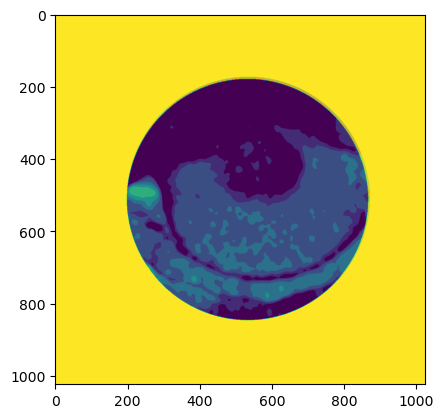

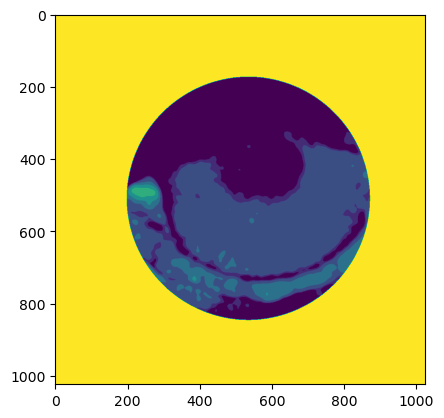

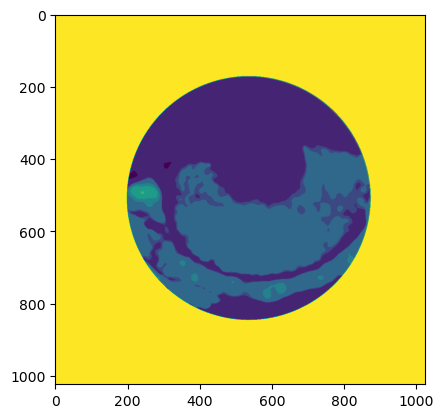

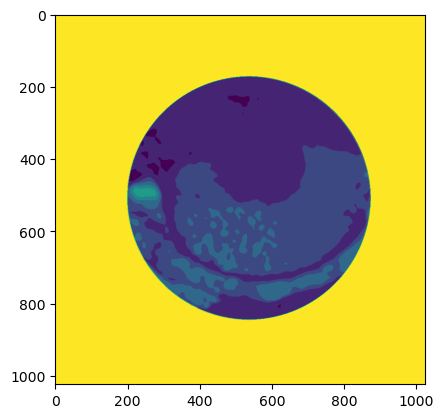

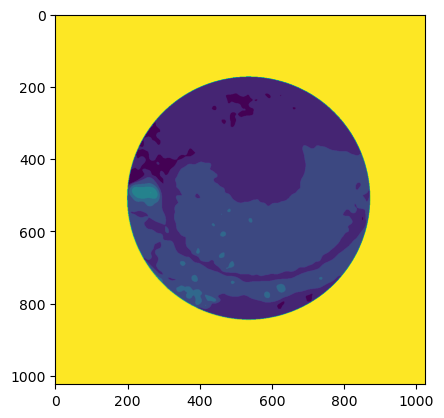

...

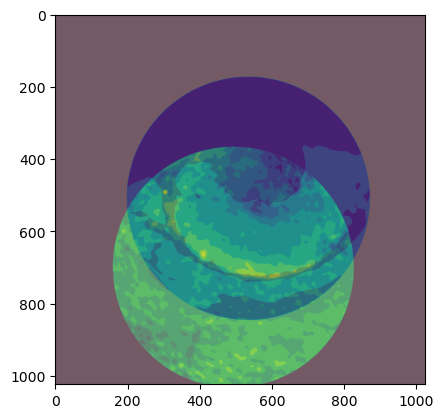

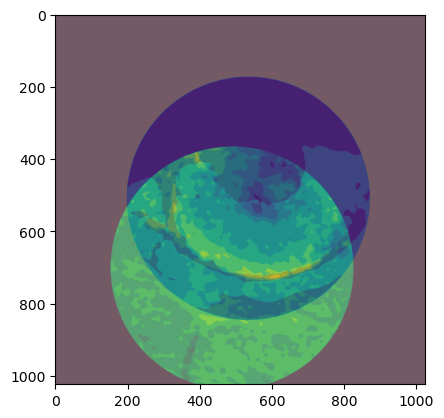

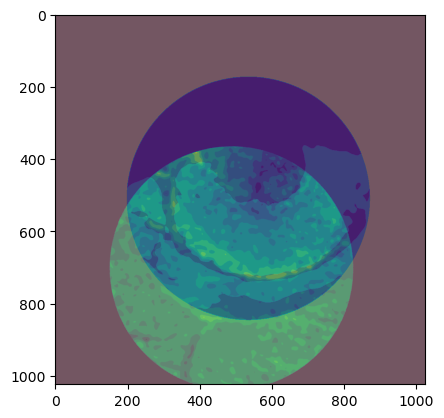

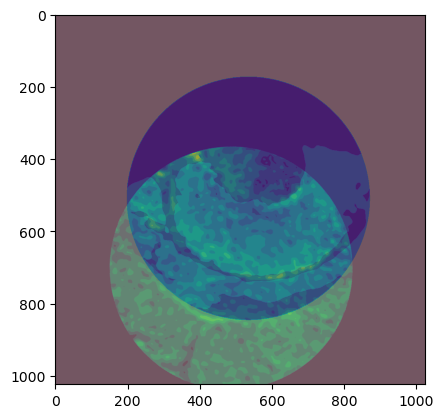

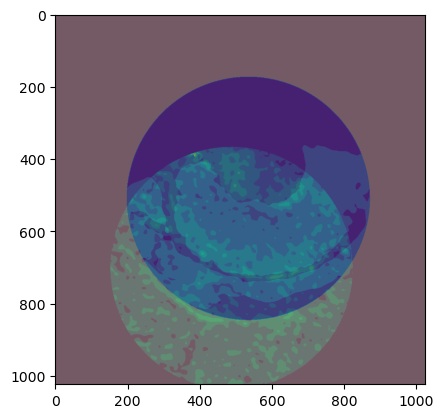

5
3
5


In [29]:
#Load in rotation data- 
guidefilepath=os.path.join(MainFolder, "Rotation_guide_data.xlsx")
rotationguide=np.array(pd.read_excel(guidefilepath, dtype=object, header=None,),dtype=object)

print(rotationguide.shape)
anglelist=rotationguide[:,1]
hsiftlist=rotationguide[:,2]
vshiftlist=rotationguide[:,3]

#Megalist has the structure- rotation set, polarization parameter, wavelength
print(len(Megalist))
print(len(Megalist[0]))
print(len(Megalist[0][0]))

Transformed_Megalist=[]
#First Apply transform to all the data to get alligned megalist-
for i in range(len(Megalist)):
    transformed_paramlist=[]
    for j in range(len(Megalist[i])):
        transformed_wavelist=[]
        for k in range(len(Megalist[i][j])):
            if Megalist[i][j][k].shape==(1024,1024):
                transformeddata=Eyeballrot(Megalist[i][j][k],Megalist[0][0][1], int(anglelist[i]), int(hsiftlist[i]), int(vshiftlist[i]))
            else:
                transformeddata=np.zeros((1024,1024))
            transformed_wavelist.append(transformeddata)
        transformed_paramlist.append(transformed_wavelist)
    Transformed_Megalist.append(transformed_paramlist)
    
#Test to make sure the new data list is the same dimensions as the old-
print(len(Transformed_Megalist))
print(len(Transformed_Megalist[0]))
print(len(Transformed_Megalist[0][0]))

#transforming list into array for easy use!
MegaarrayTransformed=np.asarray(Transformed_Megalist)

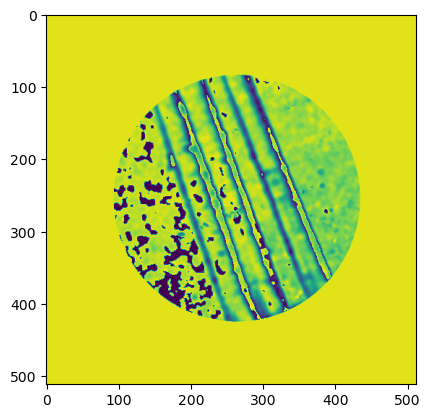

In [11]:
import PIL

#Draw Mask to be saved to data folder if desired, masks can also be loaded directly in the next cell-

#Check if datafolder already has mask folder and if not make one-
maskdatapath=os.path.join(MainFolder, "masks")
if os.path.exists(maskdatapath)==False:
    os.makedirs(maskdatapath)

#Masks will overwrite eachother with the name testmask until the next block of code is run
#This function is run with the code so the maskdatapath can be automatically reset- weird nuance of drawing library-
def save():
    # save mask to mask folder-
    filename=os.path.join(maskdatapath, "testmask.png") 
    output_image.save(filename)

#Put depolarization image in the correct format so it can be used as a reference-
#***To change the wavelength of the reference image change the 3rd number (currently 4) to index of desired wavelenth**
#Wavelength indexes- 0- 405, 1-442, 2- 473, 3-543, 4-632
maskref=cv2.resize(MegaarrayTransformed[0,0,4,:],(512,512))
maskref = (maskref * 500).astype(np.uint8)
np.where(maskref>255,255,maskref)
image1=Image.fromarray(maskref)
plt.imshow(image1)
plt.show()

width = 512 # canvas width
height = 512 # canvas height
center = height//2
white = (255, 255, 255) # canvas back
black=(0,0,0)

master = Tk()
image =  ImageTk.PhotoImage(image1) 
# create a tkinter canvas to draw on
canvas = Canvas(width=width, height=height, bg='white')
canvas.create_image(256,256, image = image)
canvas.pack()

# create an empty PIL image and draw object to draw on
output_image = PIL.Image.new("RGB", (width, height), black)
draw = ImageDraw.Draw(output_image)
canvas.pack(expand=YES, fill=BOTH)
canvas.bind("<B1-Motion>", paint)

# add a button to save the image
button=Button(text="save",command=save)
button.pack()

master.mainloop()

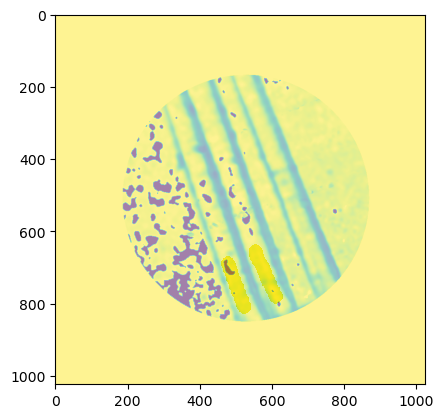

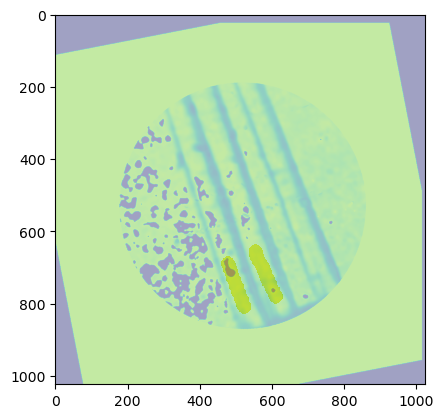

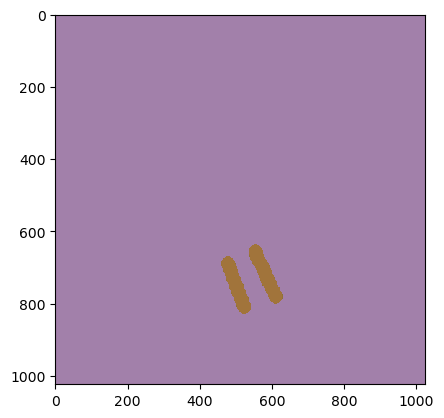

In [13]:
#Mask to be loaded, note if there's a newly drawn mask in the folder that will be used initially,
#but if the code is run again the below mask will then be used-
prexistingmaskpath=r"Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIPhantom_Data\Fiber_rotation_set\Fiber_Optic_Full_Set\masks\mask2023_03_15-16_51_39.png"

#Check if there is a newly drawn mask-
drawnmaskpath=os.path.join(maskdatapath, "testmask.png")
if os.path.exists(drawnmaskpath):
    #Load testmask and rename is with a timestamp-
    time=get_timestamp()
    maskpath=os.path.join(maskdatapath, "mask" + time +".png")
    os.rename(drawnmaskpath,os.path.join(maskdatapath, maskpath)) 
else:
    maskpath=prexistingmaskpath
    
mask=np.asarray(Image.open(maskpath))
#Standardizing Mask
mask=mask/np.max(mask)-np.min(mask)
if mask.shape[0]>mask.shape[1]:
    sqmask=mask[:mask.shape[1], :]
else:
    sqmask=mask[:,:mask.shape[0]]
if maskpath.split(".")[-1]=="png":
    #Masks drawn with this code-
    mask=np.abs(cv2.resize(sqmask[:,:,1],(1024,1024)))
    mask=np.where(mask>0.5,mask,np.nan)
if maskpath.split(".")[-1]=="tif":
    mask=np.abs(cv2.resize(sqmask,(1024,1024)))
    mask=np.where(mask<0.5,1,np.nan)  

plt.imshow(mask)
plt.imshow(MegaarrayTransformed[0,0,4,:], alpha=0.5)
plt.show()

plt.imshow(mask)
plt.imshow(MegaarrayTransformed[1,0,4,:], alpha=0.5)
plt.show()

plt.imshow(mask)
plt.imshow(MegaarrayTransformed[2,0,4,:], alpha=0.5)
plt.show()



In [30]:
#Will import, process and add every mask in a folder to a list-

mask_path_folder=os.path.join(MainFolder, "masks")
#The above is the assumed mask folder path but to change that set below to whatever you want-
# mask_path_folder=r"D:\Ferret_Brains\20221007_1646_05xM_BRAINSTEM_6-45\masks2"


masklist=[]
for filename in os.listdir(mask_path_folder):
    maskpath = os.path.join(mask_path_folder, filename)
    print(maskpath)
    if maskpath.split(".")[-1]=="png" or maskpath.split(".")[-1]=="tif":
    
        mask=np.asarray(Image.open(maskpath))
        #Standardizing Mask
        mask=mask/np.max(mask)-np.min(mask)
        if mask.shape[0]>mask.shape[1]:
            sqmask=mask[:mask.shape[1], :]
        else:
            sqmask=mask[:,:mask.shape[0]]
        if maskpath.split(".")[-1]=="png":
            #Masks drawn with this code-
            mask=np.abs(cv2.resize(sqmask[:,:,1],(1024,1024)))
            mask=np.where(mask>0.5,mask,np.nan)
        if maskpath.split(".")[-1]=="tif":
            #masks drawn with imagej-
            mask=np.abs(cv2.resize(sqmask,(1024,1024)))
            mask=np.where(mask<0.5,1,np.nan)
        masklist.append(mask)

Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\masks\mask 3.png
Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\masks\mask1.png
Q:\BOOM\PLIFerretStudy\2022_2023_Studies\PLIBrain_Data\Rotation_Studies\20221007_BRAINSTEM\masks\mask2.png


In [5]:
#Check if datafolder already has resulting plots folder and if not make one-
plotdatapath=os.path.join(MainFolder, "resulting plots")
if os.path.exists(plotdatapath)==False:
    os.makedirs(plotdatapath)

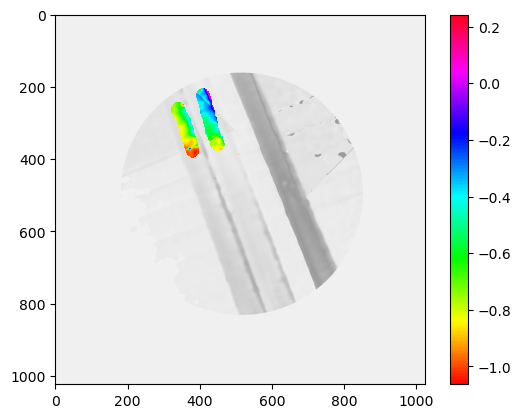

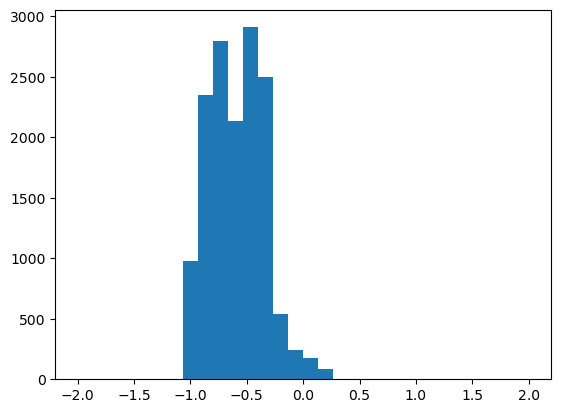

<Figure size 640x480 with 0 Axes>

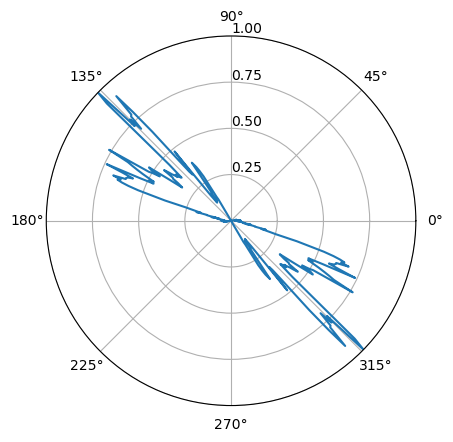

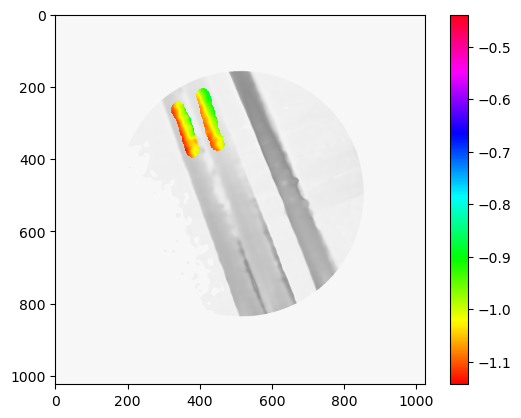

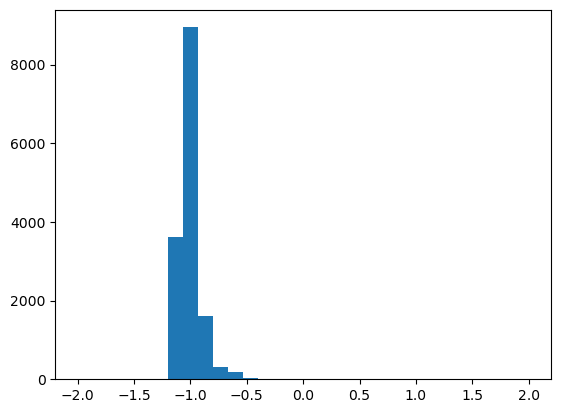

<Figure size 640x480 with 0 Axes>

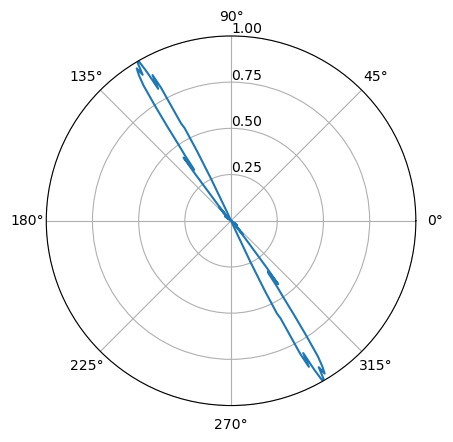

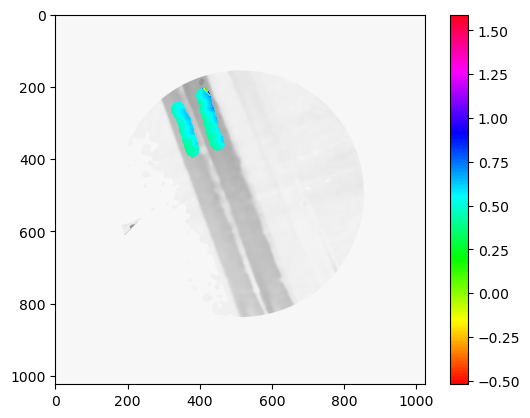

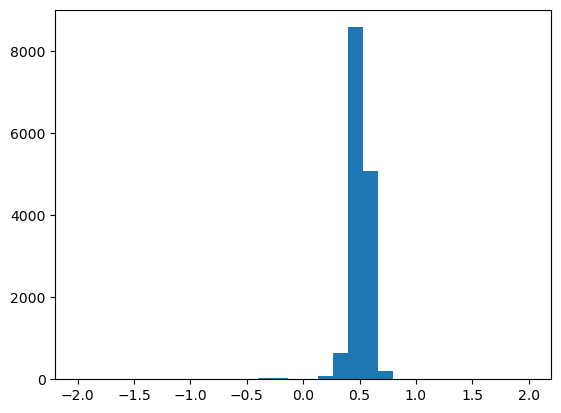

<Figure size 640x480 with 0 Axes>

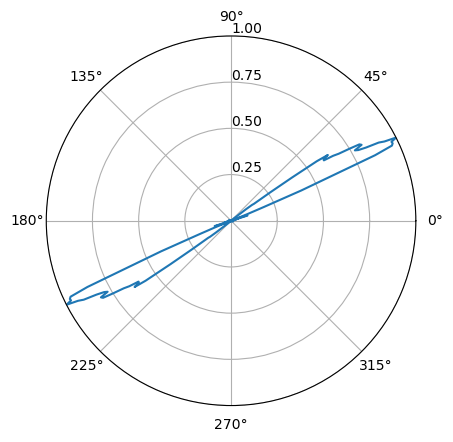

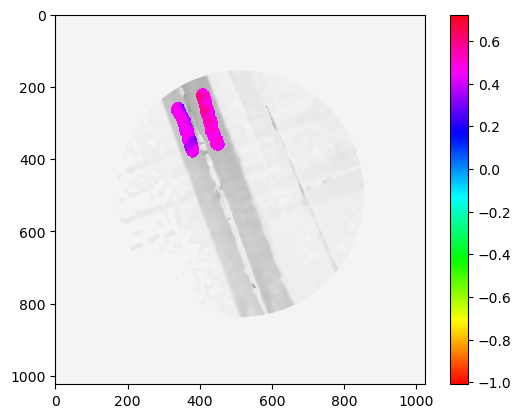

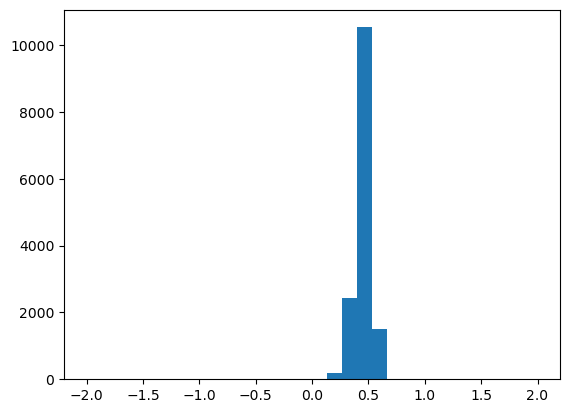

<Figure size 640x480 with 0 Axes>

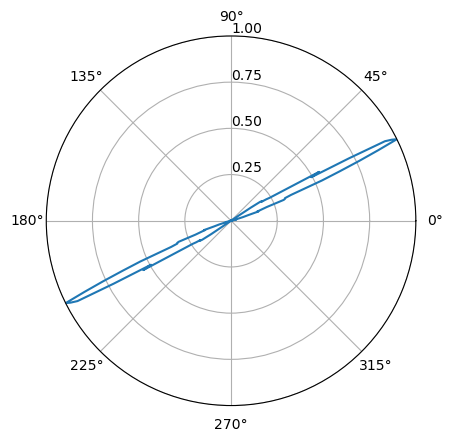

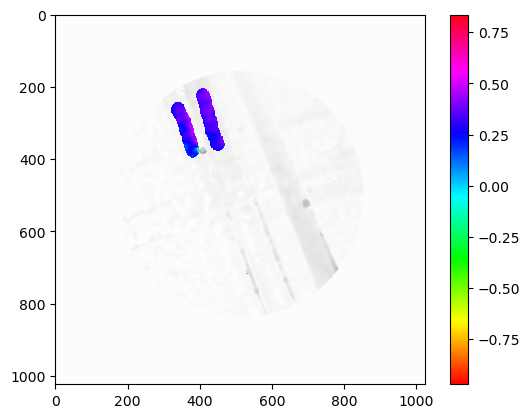

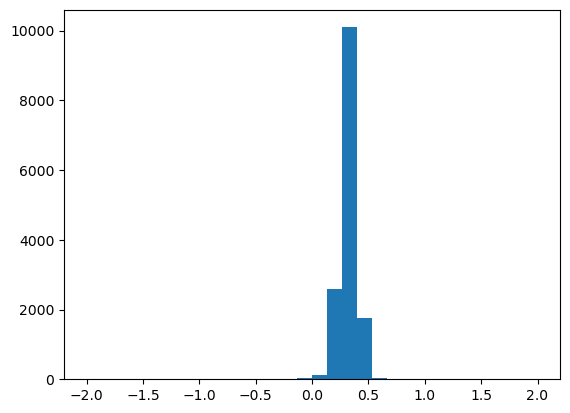

<Figure size 640x480 with 0 Axes>

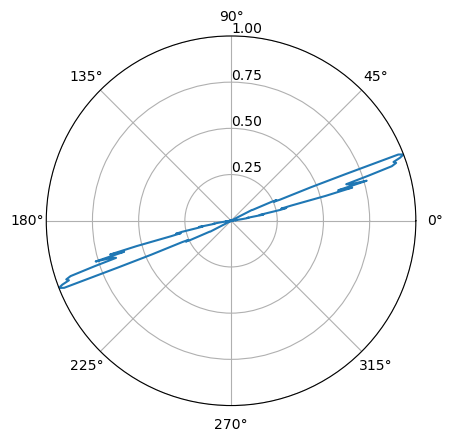

In [7]:
#Plotting Section-
#First some individual plots of various different types from one dataset-

#Data set- which set of data do you want to look at ordered according to MegaarrayTransformed order
dataset=3

#Likewise mask can be set from mask list or just imported directly above, to pick from mask list uncomment and change index to desired mask
#mask=masklist[1]

for i in range(5):
    maskedim=mask*MegaarrayTransformed[dataset,1,i,:]
#    maskedim=np.where(np.abs(maskedim)<0.0001,np.nan,maskedim)
    maskvals = maskedim[~(np.isnan(maskedim))]
    plt.imshow(MegaarrayTransformed[dataset,2,i,:], cmap='Greys', alpha=0.5)
    f=plt.imshow(maskedim, cmap='hsv')
    plt.colorbar(f)
    plt.show()
#Histogram Plot
    plt.hist( maskvals, bins=30, range=(-2, 2))
    plt.show()

    ##Polar Plot
    Anglemaskdim=mask*MegaarrayTransformed[dataset,1,i,:]
    Anglemaskvals = Anglemaskdim[~(np.isnan(Anglemaskdim))]
    
    #Angular range-
    theta = np.linspace(-np.pi/2,np.pi/2, 315)

    #Sort data into bins spanning the angular space-
    r=np.zeros(theta.shape[0])
    r=np.histogram(Anglemaskvals, bins=315, range=(-np.pi/2,np.pi/2))[0]

    #Normalize-
    r=r/np.max(r)

    thetadubs=np.linspace(-np.pi/2,3*np.pi/2, 630)
    rdubs=np.concatenate((r,r), axis=0)

    plt.figure()

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
    ax.plot(thetadubs,rdubs)
    ax.set_rmax(1)
    ax.set_rticks([0.25,0.5,0.75,1])  # Less radial ticks
    ax.set_rlabel_position(90)  # Move radial labels away from plotted line
    ax.grid(True)
    #ax.set_title("Distribution of Values by Direction", va='bottom')

    plt.show()
    


<Figure size 40000x80000 with 0 Axes>

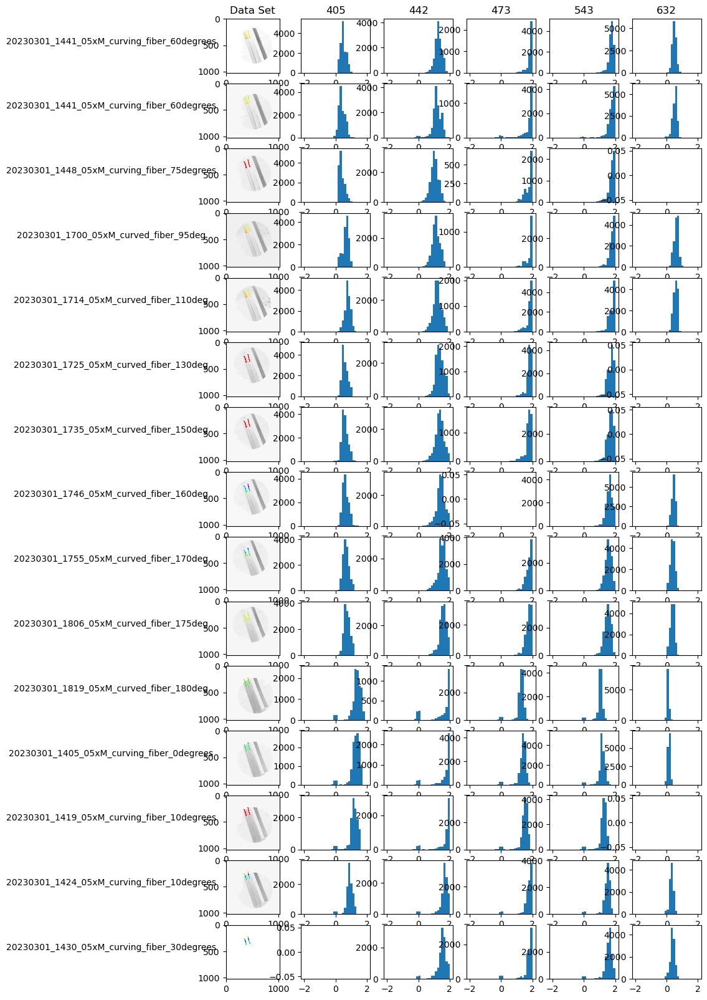

In [8]:
#Next plot histograms for a single mask-
#Because I always forget Figuresize and set inches go (x,y)

#autoset y dimension because that's my least favorite part of this-
ydim=int(MegaarrayTransformed.shape[0]/6)
if ydim==0:
    ydim=1

plt.figure(figsize=(20,20*ydim), dpi=2000)
fig, axs = plt.subplots(MegaarrayTransformed.shape[0],6)
fig.set_size_inches(10,10*ydim)

#Set titles of parameters you are interested in looking at:
axs[0,0].set_title('Data Set')
axs[0,1].set_title('405')
axs[0,2].set_title('442')
axs[0,3].set_title('473')
axs[0,4].set_title('543')
axs[0,5].set_title('632')

for i in range(MegaarrayTransformed.shape[0]):
    axs[i, 0].set_ylabel(rotationguide[i,0],labelpad=100, rotation=0)
    axs[i,0].imshow(MegaarrayTransformed[i,2,0,:], cmap='Greys', alpha=0.5)
    for j in range(5):
        maskedim=mask*MegaarrayTransformed[i,2,j,:]
        axs[i,0].imshow(maskedim, cmap='hsv')
        maskedim=np.where(np.abs(maskedim)<0.0001,np.nan,maskedim)
        maskvals = maskedim[~(np.isnan(maskedim))]
#Histogram Plot
        axs[i,j+1].hist( maskvals, bins=30, range=(-2, 2))

#To save uncomment this next line-   
#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"rotationalhistograms.png") ,  bbox_inches="tight")
plt.show()


broo
broo
broo
broo
broo
broo


C:\Users\justinamb\AppData\Local\Temp\ipykernel_15080\3967394522.py:37: RuntimeWarning: invalid value encountered in divide
  r=r/np.max(r)


broo
broo
broo
broo
broo
broo
broo
broo


C:\Users\justinamb\AppData\Local\Temp\ipykernel_15080\3967394522.py:30: RuntimeWarning: Mean of empty slice
  if np.nanmean(vals)<-np.pi/2:


<Figure size 40000x80000 with 0 Axes>

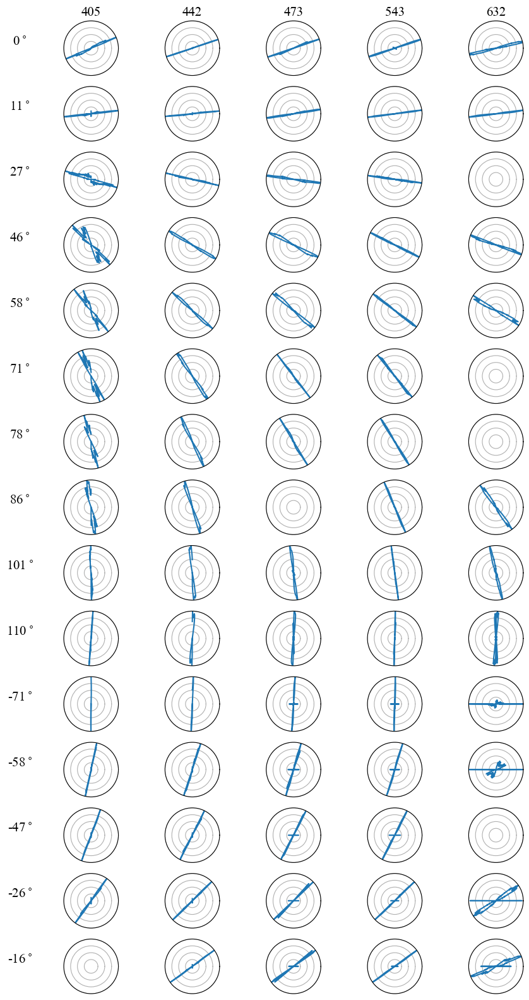

In [12]:
#Secound plot Polar Plot-

plt.figure(figsize=(20,20*ydim), dpi=2000)
fig, axs = plt.subplots(MegaarrayTransformed.shape[0],5,subplot_kw={'projection': 'polar'})
fig.set_size_inches(10,10*ydim)

#Set titles of parameters you are interested in looking at:
axs[0,0].set_title('405',font="Times New Roman",fontsize='15')
axs[0,1].set_title('442',font="Times New Roman",fontsize='15')
axs[0,2].set_title('473',font="Times New Roman",fontsize='15')
axs[0,3].set_title('543',font="Times New Roman",fontsize='15')
axs[0,4].set_title('632',font="Times New Roman",fontsize='15')

#Angular range-
theta = np.linspace(-np.pi/2,np.pi/2, 315)

for i in range(MegaarrayTransformed.shape[0]):
    axs[i, 0].set_ylabel(str(rotationguide[i,1])+"$^\circ$",font="Times New Roman",fontsize='15',labelpad=50, rotation=0)
    for j in range(5):
        dataup=MegaarrayTransformed[i,1,j,:]
        angmaskedim=mask*dataup         
        angmaskedim=np.where(np.abs(angmaskedim)<0.0001,np.nan,angmaskedim)
        angmaskvals = angmaskedim[~(np.isnan(angmaskedim))]
#Histogram Plot-        
        #Sort data into bins spanning the angular space-
        r=np.zeros(theta.shape[0])
        #phase wrapping-
        if j<2:
            vals=angmaskvals-np.pi/2
            if np.nanmean(vals)<-np.pi/2:
                vals=vals+np.pi
            r=np.histogram(vals, bins=315, range=(-np.pi/2,np.pi/2))[0]
        else:
            r=np.histogram(angmaskvals, bins=315, range=(-np.pi/2,np.pi/2))[0]
        #Normalize-
        r=r/np.max(r)
        thetadubs=np.linspace(-np.pi/2,3*np.pi/2, 630)
        rdubs=np.concatenate((r,r), axis=0)

        axs[i,j].plot(thetadubs,rdubs)
        axs[i,j].set_yticklabels([])
        axs[i,j].set_rmax(1)
        axs[i,j].set_rticks([0.25,0.5,0.75,1])  # Less radial ticks
        axs[i,j].tick_params(labelsize=5)
        axs[i,j].set_rlabel_position(90)  # Move radial labels away from plotted line
        axs[i,j].grid(True)
        axs[i,j].set_thetagrids([])
        axs[i,j].set_theta_zero_location("E")  # theta=0 at the top - ...then rotate 90 deg
        axs[i,j].set_theta_direction(-1)

#To save uncomment this next line-      
#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"polarplothistograms.png") ,  bbox_inches="tight")
plt.show()


<Figure size 40000x40000 with 0 Axes>

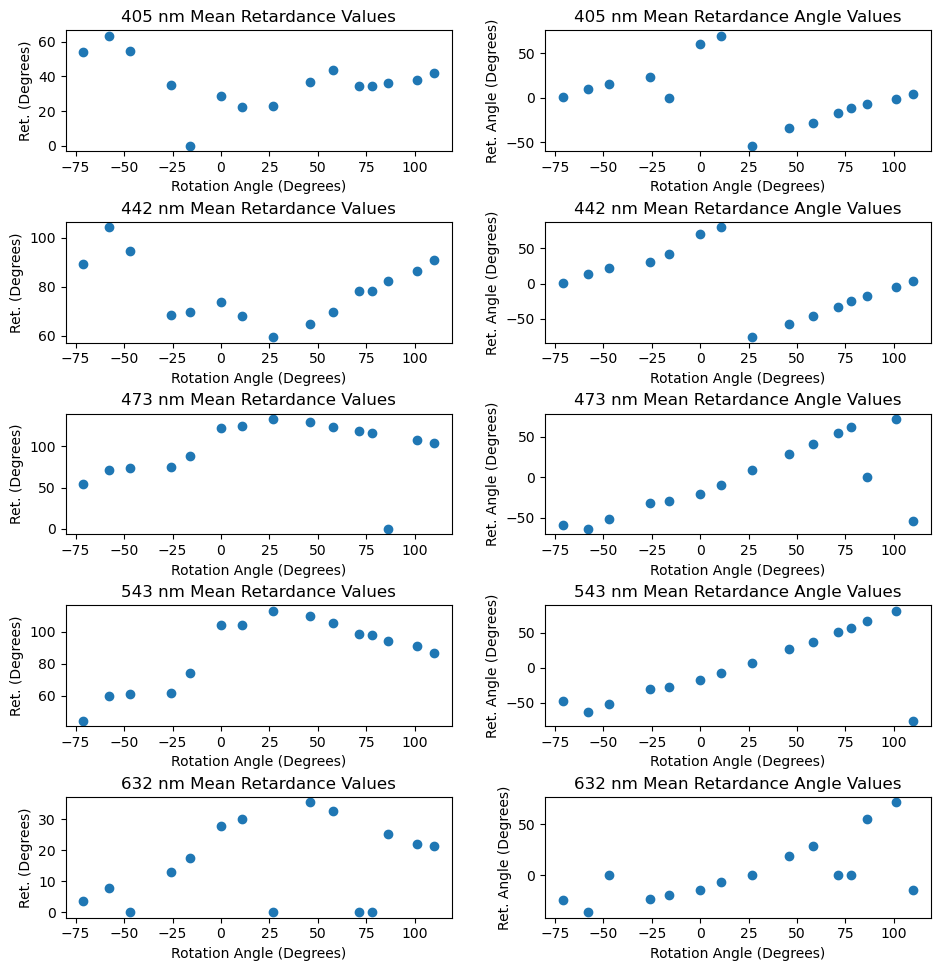

<Figure size 40000x40000 with 0 Axes>

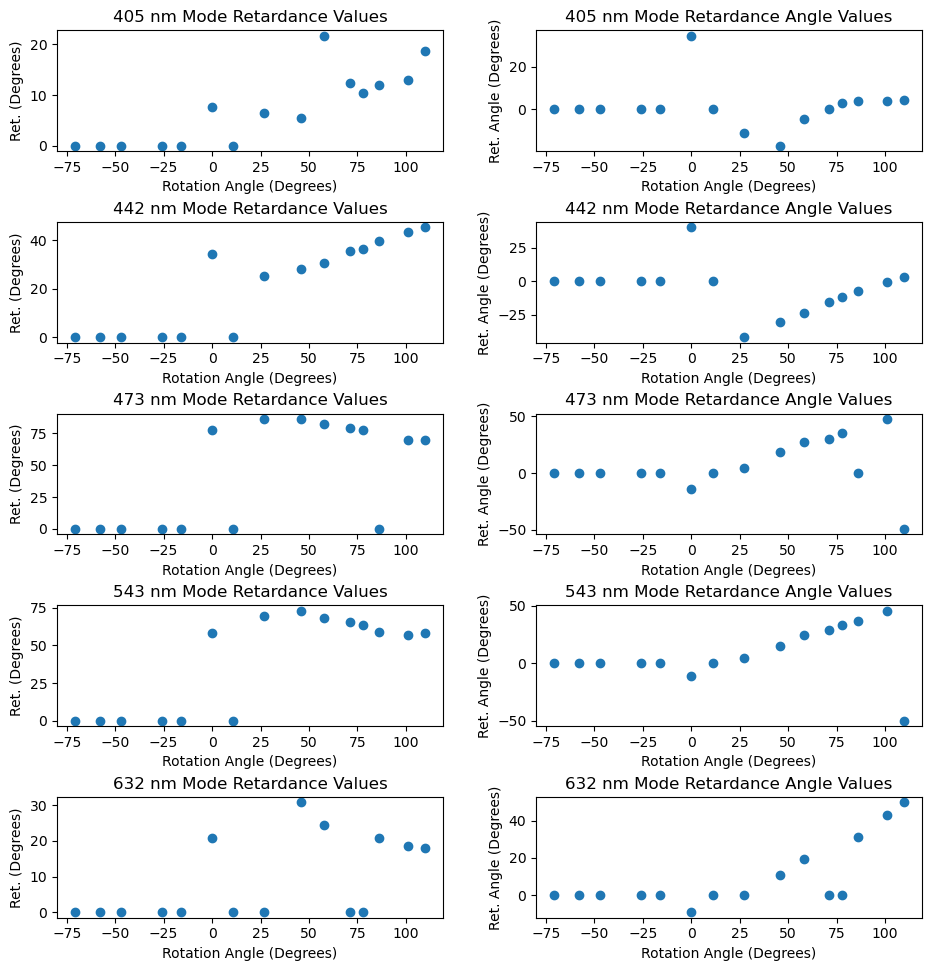

<Figure size 40000x40000 with 0 Axes>

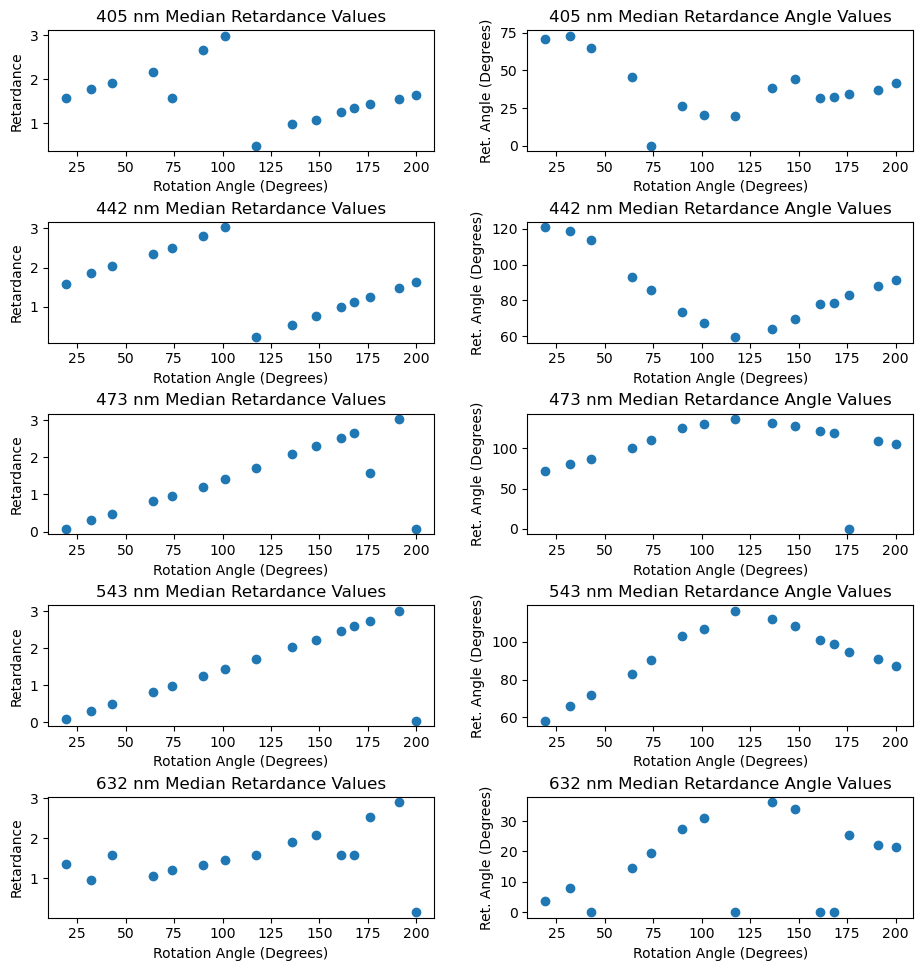

In [20]:
#Next Plot Category- applies all masks in list plots various stats vs angle-

#Generate Mean ROI Scatter plots one Ret and ret angle at each wavelength-
plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,2)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=3.0)

axs[0,0].set_title('405 nm Mean Retardance Values')
axs[1,0].set_title('442 nm Mean Retardance Values')
axs[2,0].set_title('473 nm Mean Retardance Values')
axs[3,0].set_title('543 nm Mean Retardance Values')
axs[4,0].set_title('632 nm Mean Retardance Values')

axs[0,1].set_title('405 nm Mean Retardance Angle Values')
axs[1,1].set_title('442 nm Mean Retardance Angle Values')
axs[2,1].set_title('473 nm Mean Retardance Angle Values')
axs[3,1].set_title('543 nm Mean Retardance Angle Values')
axs[4,1].set_title('632 nm Mean Retardance Angle Values')


#Uses anglelist from rotation guide for more accurate angular diffs but first they need to be converted to floats-
for i in range(len(anglelist)):
    anglelist[i]=float(anglelist[i])

for i in range(5):
    retmeans=[]
    retangmeans=[]
    for k in range(MegaarrayTransformed.shape[0]):
        retmeans.append(180*np.nanmean(mask*MegaarrayTransformed[k,2,i,:])/np.pi)
        retangmeans.append(180*np.nanmean(mask*MegaarrayTransformed[k,1,i,:])/np.pi)
    axs[i,0].scatter(anglelist,retmeans)
    axs[i,1].scatter(anglelist,retangmeans)
    axs[i,0].set_xlabel('Rotation Angle (Degrees)')
    axs[i,0].set_ylabel('Ret. (Degrees)')
    axs[i,1].set_xlabel('Rotation Angle (Degrees)')
    axs[i,1].set_ylabel('Ret. Angle (Degrees)')

#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"meanscatterplots.png") ,  bbox_inches="tight")
plt.show()

#Forth set of plots-
#Generate Mode ROI Scatter plots one Ret and ret angle at each wavelength-
plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,2)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=3.0)

axs[0,0].set_title('405 nm Mode Retardance Values')
axs[1,0].set_title('442 nm Mode Retardance Values')
axs[2,0].set_title('473 nm Mode Retardance Values')
axs[3,0].set_title('543 nm Mode Retardance Values')
axs[4,0].set_title('632 nm Mode Retardance Values')

axs[0,1].set_title('405 nm Mode Retardance Angle Values')
axs[1,1].set_title('442 nm Mode Retardance Angle Values')
axs[2,1].set_title('473 nm Mode Retardance Angle Values')
axs[3,1].set_title('543 nm Mode Retardance Angle Values')
axs[4,1].set_title('632 nm Mode Retardance Angle Values')


for i in range(5):
    retmodes=[]
    retangmodes=[]
    for k in range(MegaarrayTransformed.shape[0]):
        roidata=180*mask*MegaarrayTransformed[k,2,i,:]/np.pi
        nonaners=roidata[np.logical_not(np.isnan(roidata))]
        retmodes.append(statistics.mode(nonaners))
            
        roiangdata=180*mask*MegaarrayTransformed[k,1,i,:]/np.pi
        nonanganers=roiangdata[np.logical_not(np.isnan(roiangdata))]
        retangmodes.append(statistics.mode(nonanganers))
    axs[i,0].scatter(anglelist,retmodes)
    axs[i,1].scatter(anglelist,retangmodes)
    axs[i,0].set_xlabel('Rotation Angle (Degrees)')
    axs[i,0].set_ylabel('Ret. (Degrees)')
    axs[i,1].set_xlabel('Rotation Angle (Degrees)')
    axs[i,1].set_ylabel('Ret. Angle (Degrees)')

#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"modescatterplots.png") ,  bbox_inches="tight")
plt.show()

#Forth set of plots-
#Generate Median ROI Scatter plots one Ret and ret angle at each wavelength-
plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,2)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=3.0)

axs[0,0].set_title('405 nm Median Retardance Values')
axs[1,0].set_title('442 nm Median Retardance Values')
axs[2,0].set_title('473 nm Median Retardance Values')
axs[3,0].set_title('543 nm Median Retardance Values')
axs[4,0].set_title('632 nm Median Retardance Values')

axs[0,1].set_title('405 nm Median Retardance Angle Values')
axs[1,1].set_title('442 nm Median Retardance Angle Values')
axs[2,1].set_title('473 nm Median Retardance Angle Values')
axs[3,1].set_title('543 nm Median Retardance Angle Values')
axs[4,1].set_title('632 nm Median Retardance Angle Values')


for i in range(5):
    retmedians=[]
    retangmedians=[]
    for k in range(MegaarrayTransformed.shape[0]):
        roidata=180*mask*MegaarrayTransformed[k,2,i,:]/np.pi
        nonaners=roidata[np.logical_not(np.isnan(roidata))]
        retmedians.append(statistics.median(nonaners))
            
        roiangdata=mask*MegaarrayTransformed[k,1,i,:]
        nonanganers=roiangdata[np.logical_not(np.isnan(roiangdata))]
        retangmedians.append(statistics.median(nonanganers))
    axs[i,1].scatter(anglelist+90,retmedians)
    axs[i,0].scatter(anglelist+90,np.array(retangmedians)+np.pi/2)
    axs[i,0].set_xlabel('Rotation Angle (Degrees)')
    axs[i,0].set_ylabel('Retardance')
    axs[i,1].set_xlabel('Rotation Angle (Degrees)')
    axs[i,1].set_ylabel('Ret. Angle (Degrees)')

#To save uncomment this next line-      
#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"medianscatterplots.png") ,  bbox_inches="tight")
plt.show()


<Figure size 40000x40000 with 0 Axes>

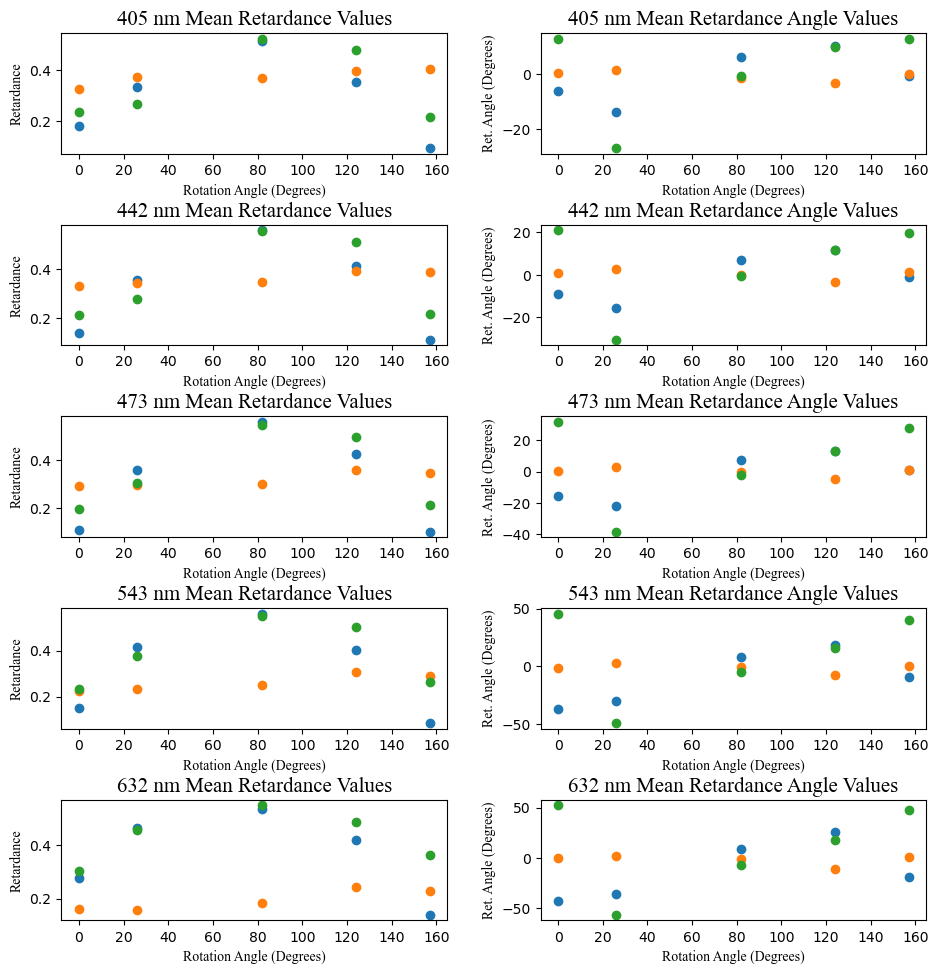

<Figure size 40000x40000 with 0 Axes>

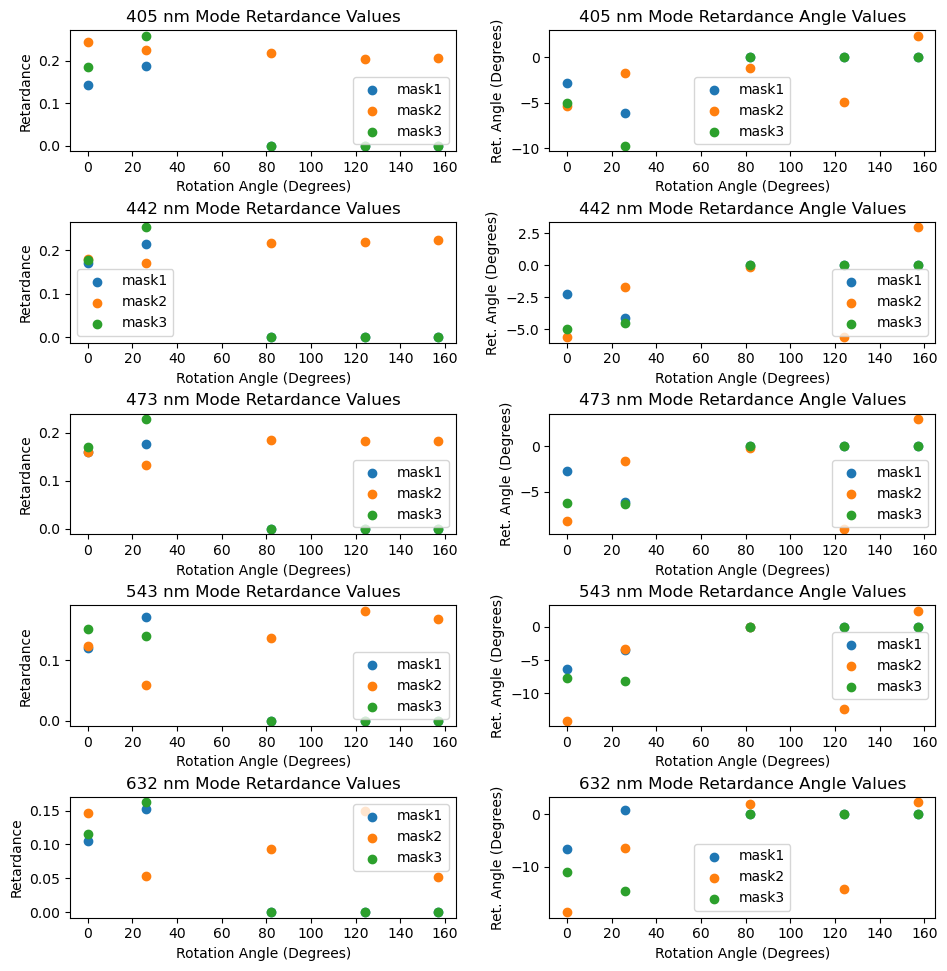

<Figure size 40000x40000 with 0 Axes>

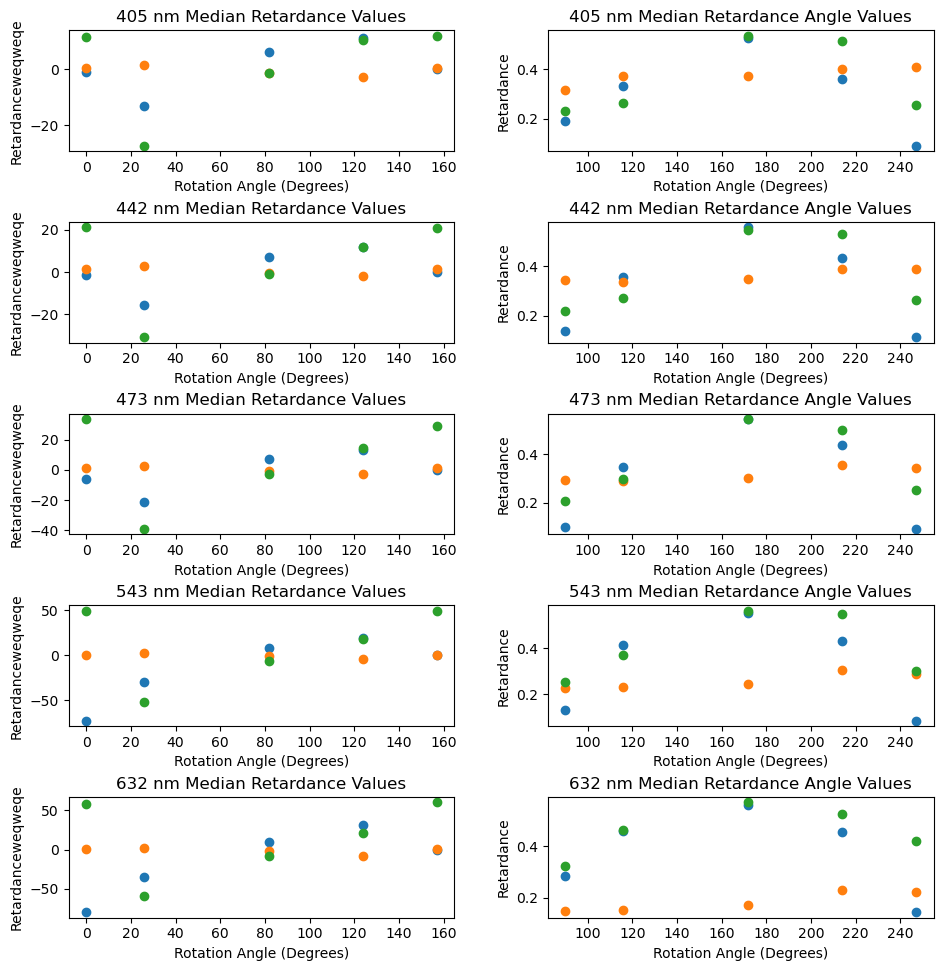

In [31]:
#Next Plot Category- applies all masks in list plots various stats vs angle-

#Generate Mean ROI Scatter plots one Ret and ret angle at each wavelength-
plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,2)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=3.0)

axs[0,0].set_title('405 nm Mean Retardance Values',font="Times New Roman",fontsize='15')
axs[1,0].set_title('442 nm Mean Retardance Values',font="Times New Roman",fontsize='15')
axs[2,0].set_title('473 nm Mean Retardance Values',font="Times New Roman",fontsize='15')
axs[3,0].set_title('543 nm Mean Retardance Values',font="Times New Roman",fontsize='15')
axs[4,0].set_title('632 nm Mean Retardance Values',font="Times New Roman",fontsize='15')

axs[0,1].set_title('405 nm Mean Retardance Angle Values',font="Times New Roman",fontsize='15')
axs[1,1].set_title('442 nm Mean Retardance Angle Values',font="Times New Roman",fontsize='15')
axs[2,1].set_title('473 nm Mean Retardance Angle Values',font="Times New Roman",fontsize='15')
axs[3,1].set_title('543 nm Mean Retardance Angle Values',font="Times New Roman",fontsize='15')
axs[4,1].set_title('632 nm Mean Retardance Angle Values',font="Times New Roman",fontsize='15')

mastermeans=[]
#Uses anglelist from rotation guide for more accurate angular diffs but first they need to be converted to floats-
for i in range(len(anglelist)):
    anglelist[i]=float(anglelist[i])

for i in range(5):
    for mask in masklist:
        retmeans=[]
        retangmeans=[]
        for k in range(MegaarrayTransformed.shape[0]):
            retmeans.append(np.nanmean(mask*MegaarrayTransformed[k,2,i,:]))
            retangmeans.append(180*np.nanmean(mask*MegaarrayTransformed[k,1,i,:])/np.pi)
        axs[i,0].scatter(anglelist,retmeans)
        axs[i,1].scatter(anglelist,retangmeans)
        mastermeans.append(retmeans)
    #axs[i,0].legend(['mask1', 'mask2', 'mask3','mask4'])        
    #axs[i,1].legend(['mask1', 'mask2', 'mask3','mask4'])
    axs[i,0].set_xlabel('Rotation Angle (Degrees)',font="Times New Roman",fontsize='10')
    axs[i,0].set_ylabel('Retardance',font="Times New Roman",fontsize='10')
    axs[i,1].set_xlabel('Rotation Angle (Degrees)',font="Times New Roman",fontsize='10')
    axs[i,1].set_ylabel('Ret. Angle (Degrees)',font="Times New Roman",fontsize='10')


#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"meanscatterplots.png") ,  bbox_inches="tight")
plt.show()

#Forth set of plots-
#Generate Mode ROI Scatter plots one Ret and ret angle at each wavelength-
plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,2)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=3.0)

axs[0,0].set_title('405 nm Mode Retardance Values')
axs[1,0].set_title('442 nm Mode Retardance Values')
axs[2,0].set_title('473 nm Mode Retardance Values')
axs[3,0].set_title('543 nm Mode Retardance Values')
axs[4,0].set_title('632 nm Mode Retardance Values')

axs[0,1].set_title('405 nm Mode Retardance Angle Values')
axs[1,1].set_title('442 nm Mode Retardance Angle Values')
axs[2,1].set_title('473 nm Mode Retardance Angle Values')
axs[3,1].set_title('543 nm Mode Retardance Angle Values')
axs[4,1].set_title('632 nm Mode Retardance Angle Values')

mastermodes=[]
for i in range(5):
    for mask in masklist:
        retmodes=[]
        retangmodes=[]
        for k in range(MegaarrayTransformed.shape[0]):
            roidata=mask*MegaarrayTransformed[k,2,i,:]
            nonaners=roidata[np.logical_not(np.isnan(roidata))]
            retmodes.append(statistics.mode(nonaners))
            
            roiangdata=180*mask*MegaarrayTransformed[k,1,i,:]/np.pi
            nonanganers=roiangdata[np.logical_not(np.isnan(roiangdata))]
            retangmodes.append(statistics.mode(nonanganers))
        axs[i,0].scatter(anglelist,retmodes)
        axs[i,1].scatter(anglelist,retangmodes)
        mastermodes.append(retmodes)
    axs[i,0].legend(['mask1', 'mask2', 'mask3'])        
    axs[i,1].legend(['mask1', 'mask2', 'mask3'])
    axs[i,0].set_xlabel('Rotation Angle (Degrees)')
    axs[i,0].set_ylabel('Retardance')
    axs[i,1].set_xlabel('Rotation Angle (Degrees)')
    axs[i,1].set_ylabel('Ret. Angle (Degrees)')


#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"modescatterplots.png") ,  bbox_inches="tight")
plt.show()

#Forth set of plots-
#Generate Median ROI Scatter plots one Ret and ret angle at each wavelength-
plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,2)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=3.0)

axs[0,0].set_title('405 nm Median Retardance Values')
axs[1,0].set_title('442 nm Median Retardance Values')
axs[2,0].set_title('473 nm Median Retardance Values')
axs[3,0].set_title('543 nm Median Retardance Values')
axs[4,0].set_title('632 nm Median Retardance Values')

axs[0,1].set_title('405 nm Median Retardance Angle Values')
axs[1,1].set_title('442 nm Median Retardance Angle Values')
axs[2,1].set_title('473 nm Median Retardance Angle Values')
axs[3,1].set_title('543 nm Median Retardance Angle Values')
axs[4,1].set_title('632 nm Median Retardance Angle Values')

mastermedians=[]
for i in range(5):
    for mask in masklist:
        retmedians=[]
        retangmedians=[]
        for k in range(MegaarrayTransformed.shape[0]):
            roidata=mask*MegaarrayTransformed[k,2,i,:]
            nonaners=roidata[np.logical_not(np.isnan(roidata))]
            retmedians.append(statistics.median(nonaners))
            
            roiangdata=180*mask*MegaarrayTransformed[k,1,i,:]/np.pi
            nonanganers=roiangdata[np.logical_not(np.isnan(roiangdata))]
            retangmedians.append(statistics.median(nonanganers))
        axs[i,1].scatter(anglelist+90,retmedians)
        axs[i,0].scatter(anglelist,retangmedians)
        mastermedians.append(retmedians)
    #axs[i,0].legend(['mask1', 'mask2', 'mask3'])        
    #axs[i,1].legend(['mask1', 'mask2', 'mask3'])
    axs[i,0].set_xlabel('Rotation Angle (Degrees)')
    axs[i,0].set_ylabel('Retardance')
    axs[i,1].set_xlabel('Rotation Angle (Degrees)')
    axs[i,1].set_ylabel('Retardance')


#To save uncomment this next line-      
#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"medianscatterplots.png") ,  bbox_inches="tight")
plt.show()


In [13]:
#Cos Fitting Functions

In [8]:
#This function makes initial guesses about what the cos parameters should be based on the data-
def guesparams(x_data, y_data):
    p0=(max(y_data)-min(y_data))/2
    p1=np.abs(2*(x_data[np.argmax(y_data)]-x_data[np.argmin(y_data)]))
    p2=x_data[np.argmax(y_data)]
    p3=np.mean(y_data)
    return([p0,p1,p2,p3])

[36.39212190454673, 318, -58, 75.30576233914083]
MSE:  103.10074170840934
[  64.46360844  499.99999998 -190.68840015  120.32624663]
[45.835833098688276, 344, -71, 118.66249336563409]
MSE:  146.5159360006946
[  55.79450323  500.         -174.00438049  152.73942748]
[29.705194931060767, 148, 27, 65.6239700301871]
MSE:  24.91632868312078
[ 26.60637846 173.45105291  22.61245372  69.05181957]
[24.81227252973622, 148, 27, 53.60880908123313]
MSE:  23.528827271491018
[ 21.35897958 173.82035361  24.17924297  56.98642364]
[10.450825192201213, 362, -71, 12.400723815653611]
MSE:  19.26485133372744
[  11.52926373  500.         -188.90486658   19.90976483]
[32.51801895426098, 196, -71, 78.81537024637389]
MSE:  31.712917724043272
[ 31.69226659 248.11494439 -89.79587568  85.78705749]
[32.02304572778313, 196, -71, 125.82825271241336]
MSE:  24.818411197733642
[ 31.20714603 248.05652685 -89.56768797 132.83807937]
[27.944860757605454, 196, 27, 76.72011165007736]
MSE:  12.867159728572554
[ 27.5057232  252.

<Figure size 40000x40000 with 0 Axes>

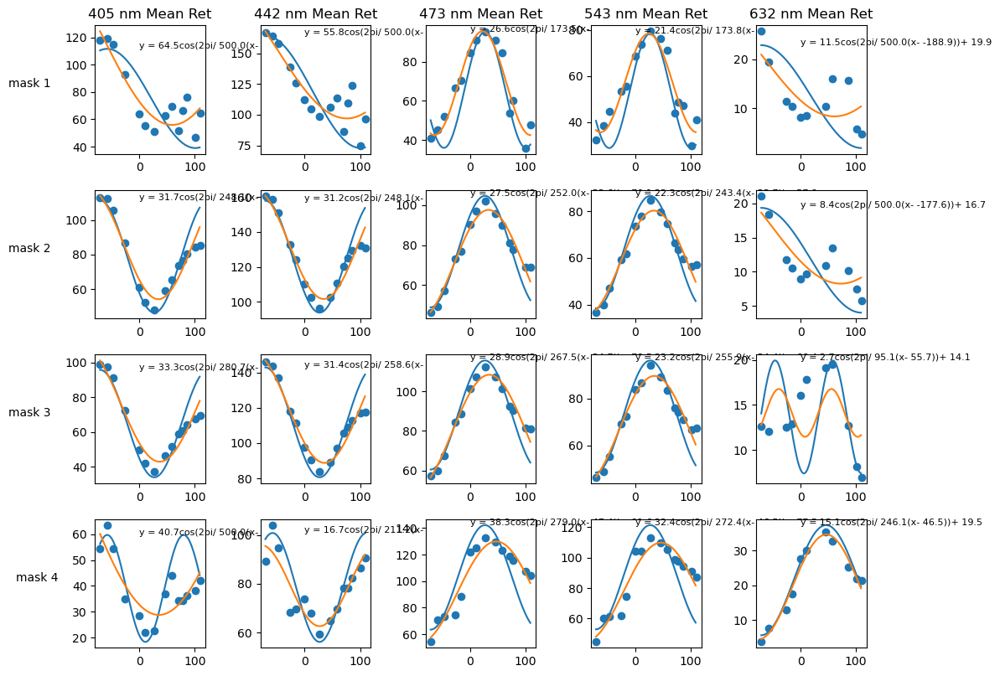

In [50]:
#Cos Fitting of masked regions to start-
def test_func(x, a, b, c, d):
    return a*np.cos(2*np.pi/b *( x - c))+d


#Generate Mean ROI Scatter plots one Ret and ret angle at each wavelength-
plt.figure(figsize=(20,5*len(masklist)), dpi=2000)
fig, axs = plt.subplots(len(masklist),5)
fig.set_size_inches(10, 2*len(masklist))
fig.tight_layout(pad=1.0)

axs[0,0].set_title('405 nm Mean Ret')
axs[0,1].set_title('442 nm Mean Ret')
axs[0,2].set_title('473 nm Mean Ret')
axs[0,3].set_title('543 nm Mean Ret')
axs[0,4].set_title('632 nm Mean Ret')

for i in range(len(anglelist)):
    anglelist[i]=int(anglelist[i])

m=len(masklist)

for k in range(len(masklist)):
    axs[k, 0].set_ylabel("mask "+str(k+1),labelpad=30, rotation=0)
    for j in range(5):
        x_data = np.array(anglelist)
        y_data = mastermeans[k+j*m]/np.max(mastermeans[k+j*m])
        indicies=np.where(y_data!=0)[0]    
        newy_data=y_data[indicies]*np.max(mastermeans[k+j*m])
        newx_data=x_data[indicies]
    
        #Guess Params
        initialparams=guesparams(newx_data, newy_data)
        print(initialparams)
    
        try:
            params, params_covariance = optimize.curve_fit(test_func, newx_data, newy_data,
                                                  p0=initialparams, bounds=(-500, 500))
            fit_y_data=[]
            for i in newx_data:          
                fit_y_data.append(test_func(i, params[0], params[1], params[2], params[3]))
        
            print("MSE: ",mean_squared_error(newy_data, fit_y_data))
        
        except ValueError:
            print("No fit found for ",k+m*j)
            params=[0,0.1,0,0]
    
        print(params)

        axs[k,j].scatter(newx_data, newy_data, label='Data')
    
        new_y_data=[]
        new_y_data_fit=[]
        finerrange=range(min(newx_data),max(newx_data),1)
    
        for i in finerrange:
            new_y_data.append(test_func(i, initialparams[0], initialparams[1], initialparams[2],initialparams[3]))
            new_y_data_fit.append(test_func(i, params[0], params[1], params[2], params[3]))
    
        axs[k,j].plot(finerrange,new_y_data,label= 'Guess function')
        axs[k,j].plot(finerrange,new_y_data_fit,label= 'Fit function')
    
        axs[k,j].text(0, max(new_y_data), 'y = ' + '{:.1f}'.format(params[0]) + 'cos(2pi/'+' {:.1f}'.format(params[1]) + '(x-'+' {:.1f}'.format(params[2])+'))+'+' {:.1f}'.format(params[3]), size=8, wrap=True)

plt.savefig(os.path.join(plotdatapath, get_timestamp() +"cosfitplots.png") ,  bbox_inches="tight")   
plt.show()

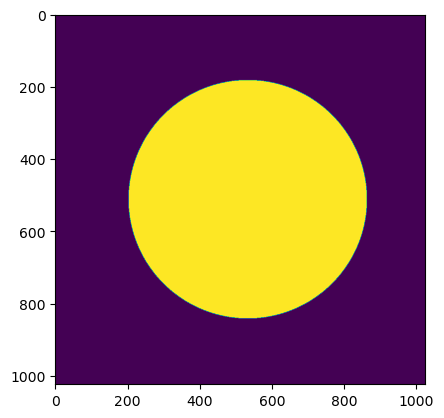

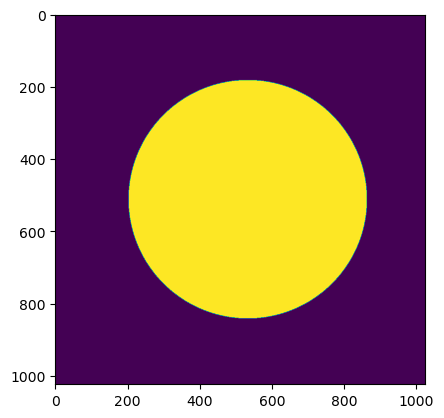

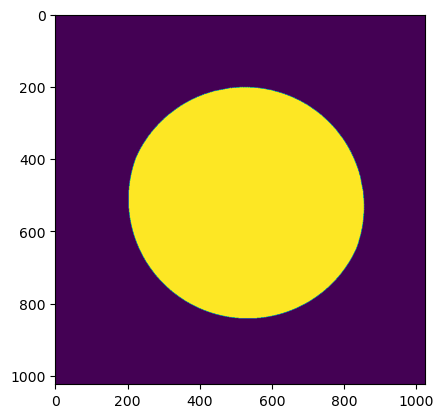

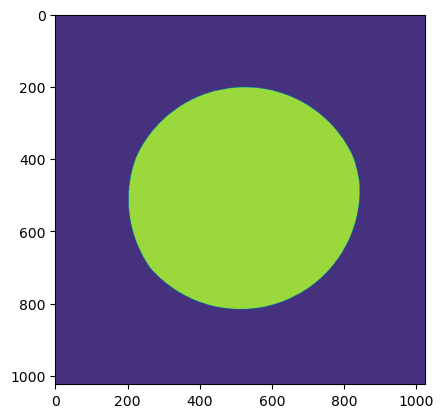

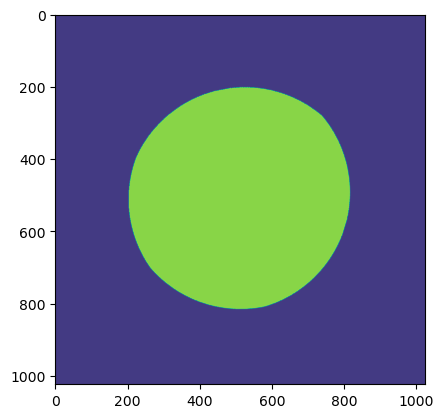

...

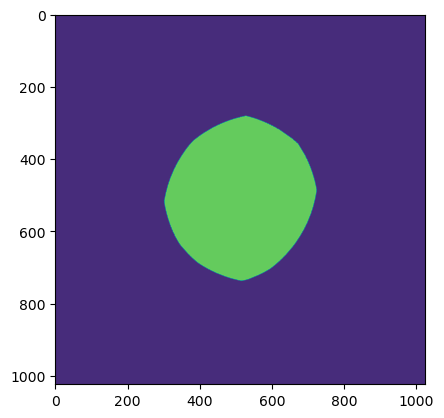

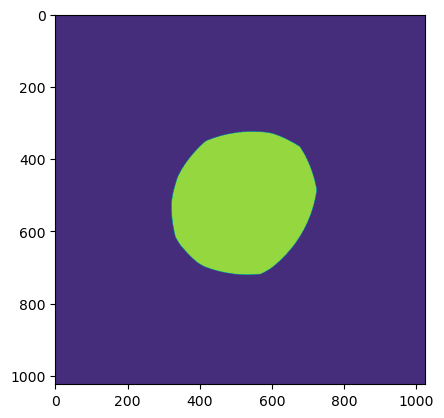

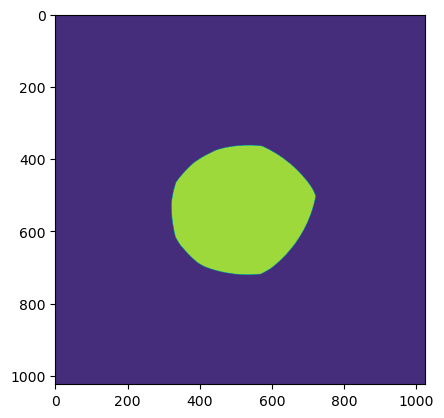

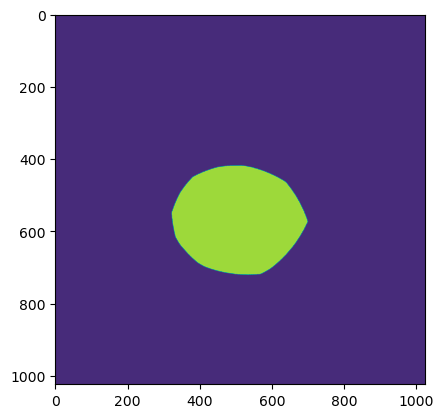

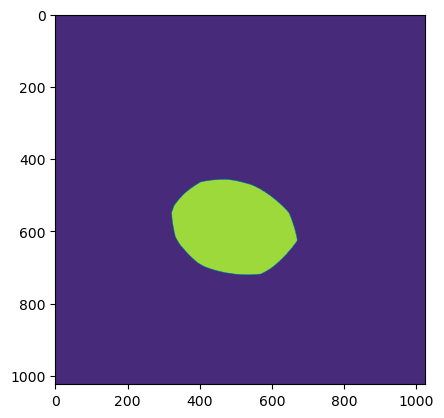

In [36]:
#Now to apply this in to the image data!

#First we need to make a mask to block off areas that are outside of the overlap regions of the images-
#To start we can make a circle map which covers the fov of the microscope and apply the same translations to that bad boy-
mask =np.zeros((1024,1024), dtype=np.uint8)
rr, cc = disk((512, 533), 330)
mask[rr, cc] = 1
plt.imshow(mask)
plt.show()

#Make new masks using rotation guide-
#First Apply transform to all the data to get alligned mask-
for i in range(len(Megalist)):
    transformedmask=Eyeballrot(mask,mask, int(anglelist[i]), int(hsiftlist[i]), int(vshiftlist[i]), show='n')
    mask=transformedmask*mask
    plt.imshow(mask)
    plt.show()

    
mask=np.where(mask==0,np.nan,1)

In [48]:
#Now we can do a little data reorganization and apply this to the data stacks-
MAret_commonregion=MegaarrayTransformed[:,2,:,:]*mask
    

divsize=16
divscale=int(1024/divsize)
outputparamsguess=np.zeros((5,4,divscale,divscale))
outputparams1=np.zeros((5,4,divscale,divscale))
mse=np.zeros((divscale,divscale))
for wv in range(5):
    for j in range(divscale):
        for k in range(divscale):
            roi=MAret_commonregion[:,wv,divsize*j:divsize*(j+1),divsize*k:divsize*(k+1)]
            roi_nonan=roi[np.logical_not(np.isnan(roi))]
            if roi_nonan.shape[0]==0:
                outputparams1[wv,:,j,k]=np.nan
                mse[j,k]=np.nan
            else:
                roimeans=np.nanmean(np.nanmean(roi,axis=2),axis=1)        
                x_data = np.array(anglelist)
                y_data = roimeans/np.max(roimeans)
                indicies=np.where(y_data!=0)[0]
                newy_data=y_data[indicies]*np.max(roimeans)
                newx_data=x_data[indicies]
                
                #Guess Params
                initialparams=guesparams(newx_data, newy_data)
    
                try:
                    params, params_covariance = optimize.curve_fit(test_func, newx_data, newy_data,
                                                          p0=initialparams, bounds=(-500, 500))
#                     fit_y_data=[]
#                     for i in newx_data:          
#                         fit_y_data.append(test_func(i, params[0], params[1], params[2], params[3]))
        
#                         mse[j,k]=mean_squared_error(newy_data, fit_y_data)
        
                except:
                    params=[np.nan,np.nan,np.nan,np.nan]

                outputparamsguess[wv,:,j,k]=initialparams
                outputparams1[wv,:,j,k]=params
                
                mse[j,k]=np.nan
                




C:\Users\justinamb\AppData\Local\Temp\ipykernel_2932\1766878730.py:19: RuntimeWarning: Mean of empty slice
  roimeans=np.nanmean(np.nanmean(roi,axis=2),axis=1)


<Figure size 40000x40000 with 0 Axes>

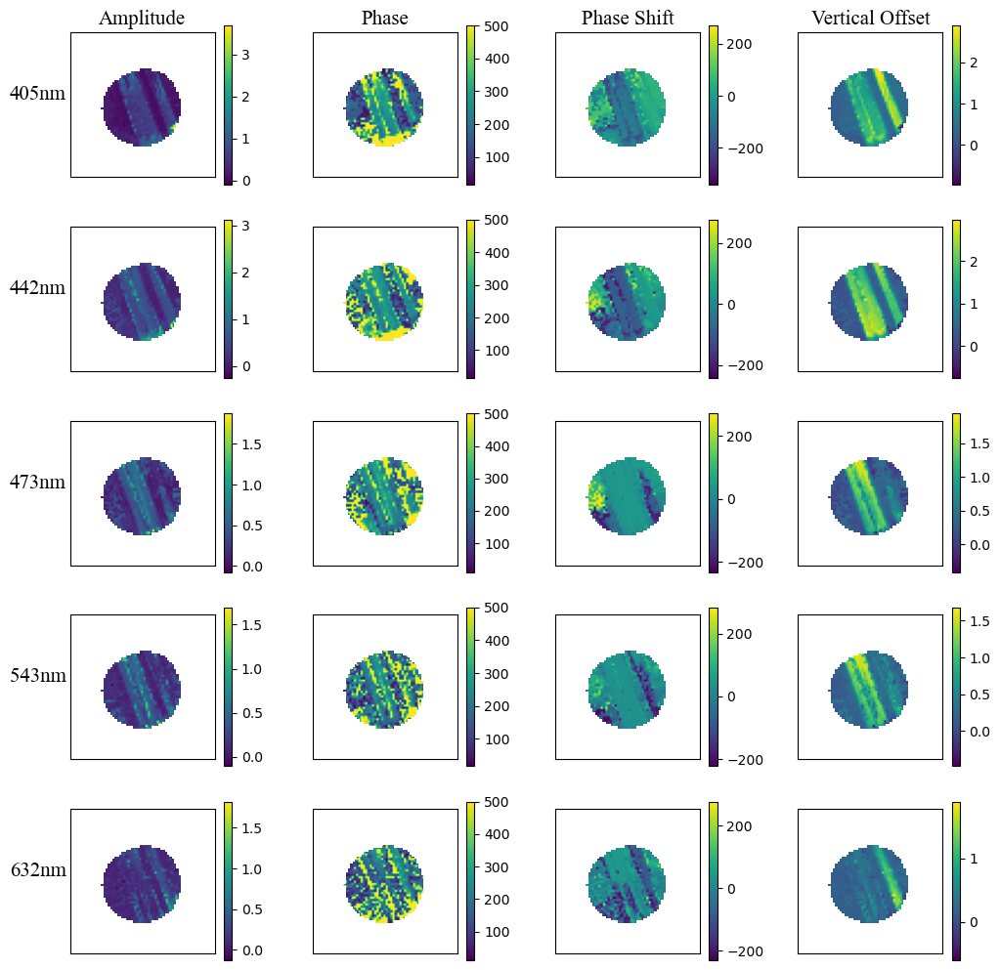

In [49]:
plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,4)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=0.5)
csfont = {'fontname':'Times New Roman'}

axs[0, 0].set_title('Amplitude', fontsize = 15, **csfont)
axs[0, 1].set_title('Phase', fontsize = 15,**csfont)
axs[0, 2].set_title('Phase Shift', fontsize = 15,**csfont)
axs[0, 3].set_title('Vertical Offset', fontsize = 15,**csfont)


#Set titles of parameters you are interested in looking at:
axs[0,0].set_ylabel('405nm',labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[1,0].set_ylabel('442nm', labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[2,0].set_ylabel('473nm', labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[3,0].set_ylabel('543nm', labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[4,0].set_ylabel('632nm', labelpad=20, rotation=0, fontsize = 15,**csfont)

for i in range(4):
    for j in range(5):
        f=axs[j,i].imshow(outputparams1[j,i,::])
        cbar=plt.colorbar(f,ax=axs[j,i])
        axs[j,i].set_yticklabels([])
        axs[j,i].set_xticklabels([])
        axs[j,i].set_xticks([])
        axs[j,i].set_yticks([])

plt.savefig(os.path.join(plotdatapath, get_timestamp() +"cosfitwholeimage.png") ,  bbox_inches="tight") 
plt.show()

<Figure size 40000x40000 with 0 Axes>

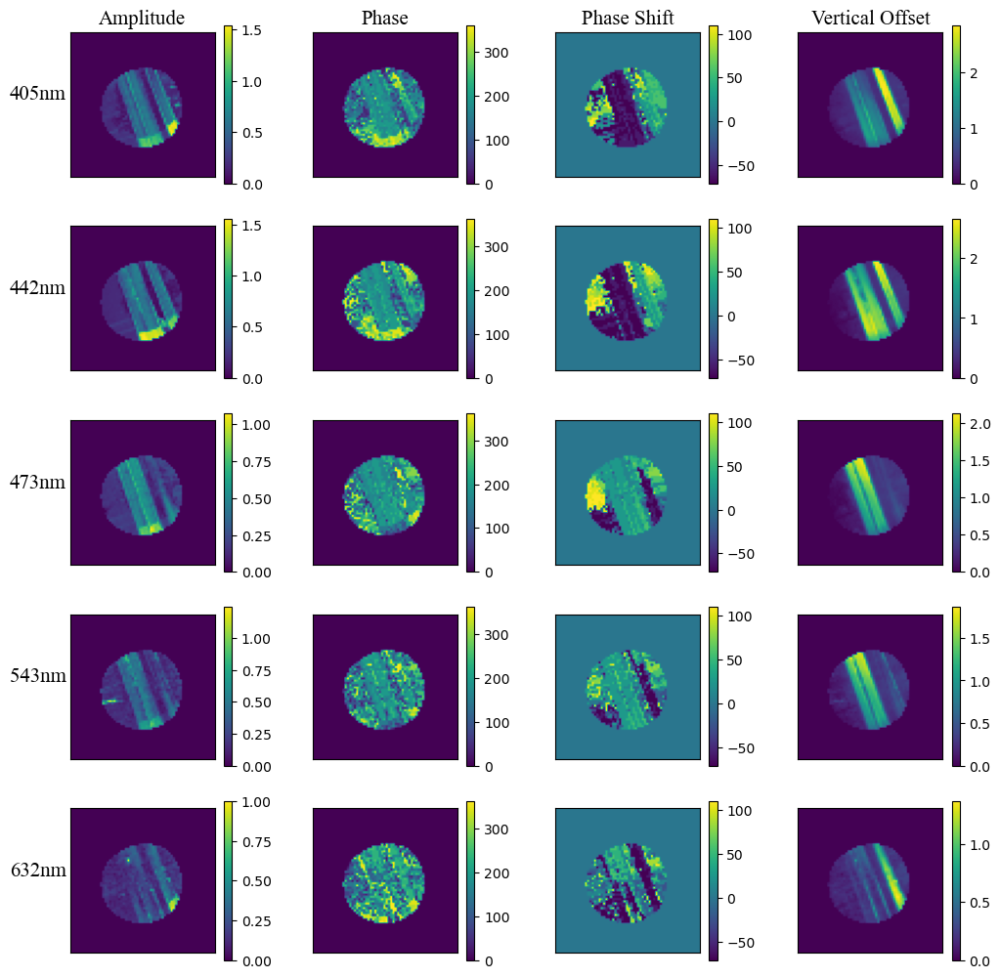

In [46]:
#Make plots with guess data to see where we're at-

plt.figure(figsize=(20,20), dpi=2000)
fig, axs = plt.subplots(5,4)
fig.set_size_inches(10, 10)
fig.tight_layout(pad=0.5)
csfont = {'fontname':'Times New Roman'}

axs[0, 0].set_title('Amplitude', fontsize = 15, **csfont)
axs[0, 1].set_title('Phase', fontsize = 15,**csfont)
axs[0, 2].set_title('Phase Shift', fontsize = 15,**csfont)
axs[0, 3].set_title('Vertical Offset', fontsize = 15,**csfont)


#Set titles of parameters you are interested in looking at:
axs[0,0].set_ylabel('405nm',labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[1,0].set_ylabel('442nm', labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[2,0].set_ylabel('473nm', labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[3,0].set_ylabel('543nm', labelpad=20, rotation=0, fontsize = 15,**csfont)
axs[4,0].set_ylabel('632nm', labelpad=20, rotation=0, fontsize = 15,**csfont)

for i in range(4):
    for j in range(5):
        f=axs[j,i].imshow(outputparamsguess[j,i,::])
        cbar=plt.colorbar(f,ax=axs[j,i])
        axs[j,i].set_yticklabels([])
        axs[j,i].set_xticklabels([])
        axs[j,i].set_xticks([])
        axs[j,i].set_yticks([])

#plt.savefig(os.path.join(plotdatapath, get_timestamp() +"cosfitguess.png") ,  bbox_inches="tight") 
plt.show()